# Projeto Final - WW_stats - A81824

In [1]:
pip install ploty

Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement ploty (from versions: none)
ERROR: No matching distribution found for ploty
You should consider upgrading via the 'c:\osgeo4~1\bin\python3.exe -m pip install --upgrade pip' command.


In [2]:
pip install chart_studio

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\osgeo4~1\bin\python3.exe -m pip install --upgrade pip' command.


In [3]:
pip install plotly_express

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\osgeo4~1\bin\python3.exe -m pip install --upgrade pip' command.


In [4]:
pip install request

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\osgeo4~1\bin\python3.exe -m pip install --upgrade pip' command.


## Tracking do crescimento de casos de COVID-19

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

import plotly_express as px
import plotly.graph_objects as go
import chart_studio.plotly as py
import request
import urllib

In [6]:
url='https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv'
file = urllib.request.urlopen(url)
dataCOV = pd.read_csv(url)

dataCOV = dataCOV.replace({'0':np.nan, 0:np.nan})
dataCOV

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,5/18/20,5/19/20,5/20/20,5/21/20,5/22/20,5/23/20,5/24/20,5/25/20,5/26/20,5/27/20
0,NaN,Afghanistan,33.000000,65.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,7072.0,7653.0,8145.0,8676.0,9216.0,9998.0,10582.0,11173.0,11831.0,12456.0
1,NaN,Albania,41.153300,20.168300,NaN,NaN,NaN,NaN,NaN,NaN,...,948.0,949.0,964.0,969.0,981.0,989.0,998.0,1004.0,1029.0,1050.0
2,NaN,Algeria,28.033900,1.659600,NaN,NaN,NaN,NaN,NaN,NaN,...,7201.0,7377.0,7542.0,7728.0,7918.0,8113.0,8306.0,8503.0,8697.0,8857.0
3,NaN,Andorra,42.506300,1.521800,NaN,NaN,NaN,NaN,NaN,NaN,...,761.0,761.0,762.0,762.0,762.0,762.0,762.0,763.0,763.0,763.0
4,NaN,Angola,-11.202700,17.873900,NaN,NaN,NaN,NaN,NaN,NaN,...,50.0,52.0,52.0,58.0,60.0,61.0,69.0,70.0,70.0,71.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,NaN,Sao Tome and Principe,0.186360,6.613081,NaN,NaN,NaN,NaN,NaN,NaN,...,246.0,251.0,251.0,251.0,251.0,251.0,251.0,299.0,441.0,443.0
262,NaN,Yemen,15.552727,48.516388,NaN,NaN,NaN,NaN,NaN,NaN,...,130.0,167.0,184.0,197.0,209.0,212.0,222.0,233.0,249.0,256.0
263,NaN,Comoros,-11.645500,43.333300,NaN,NaN,NaN,NaN,NaN,NaN,...,11.0,11.0,34.0,34.0,78.0,78.0,87.0,87.0,87.0,87.0
264,NaN,Tajikistan,38.861034,71.276093,NaN,NaN,NaN,NaN,NaN,NaN,...,1729.0,1936.0,2140.0,2350.0,2551.0,2738.0,2929.0,3100.0,3266.0,3424.0


In [7]:
#df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')


### Análise Global do COVID-19

In [8]:
cases = dataCOV.iloc[:,[1,-1]].groupby('Country/Region').sum()
mostrecentdate = cases.columns[0]
print('\nTotal number of cases (in countries with at least 100 cases) as of', mostrecentdate)

cases = cases.sort_values(by = mostrecentdate, ascending = False)
cases = cases[cases[mostrecentdate] >= 100]
cases


Total number of cases (in countries with at least 100 cases) as of 5/27/20


,5/27/20
Country/Region,
US,1699176.0
Brazil,411821.0
Russia,370680.0
United Kingdom,268619.0
Spain,236259.0
...,...
Cambodia,124.0
Syria,121.0
Trinidad and Tobago,116.0


### Curve Fitting Casos Globais de COVID-19

In [9]:
def logistic(t, a, b, c, d):
    return c + (d - c)/(1 + a * np.exp(- b * t))

def exponential(t, a, b, c):
    return a * np.exp(b * t) + c

def plotCases(dataframe, column, country):
    
    co = dataframe[dataframe[column] == country].iloc[:,4:].T.sum(axis = 1)
    co = pd.DataFrame(co)
    co.columns = ['Cases']
    co = co.loc[co['Cases'] > 0]
    
    y = np.array(co['Cases'])
    x = np.arange(y.size)
    
    recentdbltime = float('NaN')
    
    if len(y) >= 7:
        
        current = y[-1]
        lastweek = y[-8]
        
        if current > lastweek:
            print('\n** Based on Most Recent Week of Data **\n')
            print('\tConfirmed cases on',co.index[-1],'\t',current)
            print('\tConfirmed cases on',co.index[-8],'\t',lastweek)
            ratio = current/lastweek
            print('\tRatio:',round(ratio,2))
            print('\tWeekly increase:',round( 100 * (ratio - 1), 1),'%')
            dailypercentchange = round( 100 * (pow(ratio, 1/7) - 1), 1)
            print('\tDaily increase:', dailypercentchange, '% per day')
            recentdbltime = round( 7 * np.log(2) / np.log(ratio), 1)
            print('\tDoubling Time (represents recent growth):',recentdbltime,'days')

    plt.figure(figsize=(10,5))
    plt.plot(x, y, 'ko', label="Original Data")
    
    logisticworked = False
    exponentialworked = False
    
    try:
        lpopt, lpcov = curve_fit(logistic, x, y, maxfev=10000)
        lerror = np.sqrt(np.diag(lpcov))
        
        # for logistic curve at half maximum, slope = growth rate/2. so doubling time = ln(2) / (growth rate/2)
        ldoubletime = np.log(2)/(lpopt[1]/2)
        # standard error
        ldoubletimeerror = 1.96 * ldoubletime * np.abs(lerror[1]/lpopt[1])
        
        # calculate R^2
        residuals = y - logistic(x, *lpopt)
        ss_res = np.sum(residuals**2)
        ss_tot = np.sum((y - np.mean(y))**2)
        logisticr2 = 1 - (ss_res / ss_tot)  
        
        if logisticr2 > 0.95:
            plt.plot(x, logistic(x, *lpopt), 'b--', label="Logistic Curve Fit")
            print('\n** Based on Logistic Fit**\n')
            print('\tR^2:', logisticr2)
            print('\tDoubling Time (during middle of growth): ', round(ldoubletime,2), '(±', round(ldoubletimeerror,2),') days')
            logisticworked = True
    
    except:
        pass
    
    try:
        epopt, epcov = curve_fit(exponential, x, y, bounds=([0,0,-100],[100,0.9,100]), maxfev=10000)
        eerror = np.sqrt(np.diag(epcov))
        
        # for exponential curve, slope = growth rate. so doubling time = ln(2) / growth rate
        edoubletime = np.log(2)/epopt[1]
        # standard error
        edoubletimeerror = 1.96 * edoubletime * np.abs(eerror[1]/epopt[1])
        
        # calculate R^2
        residuals = y - exponential(x, *epopt)
        ss_res = np.sum(residuals**2)
        ss_tot = np.sum((y - np.mean(y))**2)
        expr2 = 1 - (ss_res / ss_tot)
        
        if expr2 > 0.95:
            plt.plot(x, exponential(x, *epopt), 'r--', label="Exponential Curve Fit")
            print('\n** Based on Exponential Fit **\n')
            print('\tR^2:', expr2)
            print('\tDoubling Time (represents overall growth): ', round(edoubletime,2), '(±', round(edoubletimeerror,2),') days')
            exponentialworked = True
            
    except:
        pass
    
    plt.title(country + ' Cumulative COVID-19 Cases. (Updated on '+mostrecentdate+')', fontsize="x-large")
    plt.xlabel('Days', fontsize="x-large")
    plt.ylabel('Total Cases', fontsize="x-large")
    plt.legend(fontsize="x-large")
    plt.show()
    
    if logisticworked and exponentialworked:
        if round(logisticr2,2) > round(expr2,2):
            return [ldoubletime, ldoubletimeerror, recentdbltime]
        else:
            return [edoubletime, edoubletimeerror, recentdbltime]
            
    if logisticworked:
        return [ldoubletime, ldoubletimeerror, recentdbltime]
    
    if exponentialworked:
        return [edoubletime, edoubletimeerror, recentdbltime]
    
    else:
        return [float('NaN'), float('NaN'), recentdbltime]



US

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 1699176.0
	Confirmed cases on 5/20/20 	 1551853.0
	Ratio: 1.09
	Weekly increase: 9.5 %
	Daily increase: 1.3 % per day
	Doubling Time (represents recent growth): 53.5 days

** Based on Logistic Fit**

	R^2: 0.9961565372005807
	Doubling Time (during middle of growth):  17.42 (± 0.9 ) days


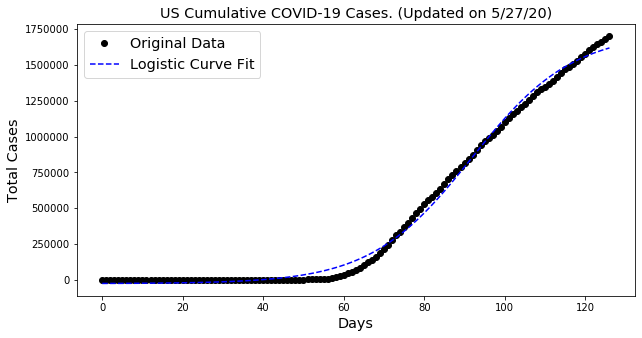



Brazil

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 411821.0
	Confirmed cases on 5/20/20 	 291579.0
	Ratio: 1.41
	Weekly increase: 41.2 %
	Daily increase: 5.1 % per day
	Doubling Time (represents recent growth): 14.1 days

** Based on Logistic Fit**

	R^2: 0.9995980108236386
	Doubling Time (during middle of growth):  19.21 (± 0.53 ) days


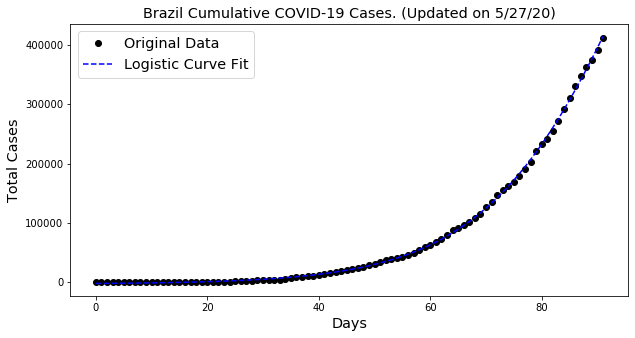



Russia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 370680.0
	Confirmed cases on 5/20/20 	 308705.0
	Ratio: 1.2
	Weekly increase: 20.1 %
	Daily increase: 2.6 % per day
	Doubling Time (represents recent growth): 26.5 days

** Based on Logistic Fit**

	R^2: 0.9995667367964295
	Doubling Time (during middle of growth):  13.38 (± 0.25 ) days


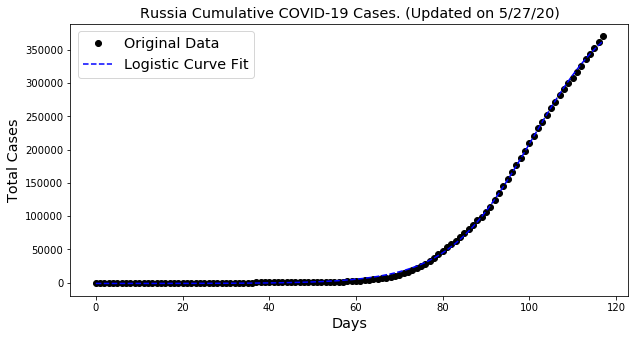



United Kingdom

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 268619.0
	Confirmed cases on 5/20/20 	 249619.0
	Ratio: 1.08
	Weekly increase: 7.6 %
	Daily increase: 1.1 % per day
	Doubling Time (represents recent growth): 66.1 days

** Based on Logistic Fit**

	R^2: 0.997724698991822
	Doubling Time (during middle of growth):  16.31 (± 0.67 ) days


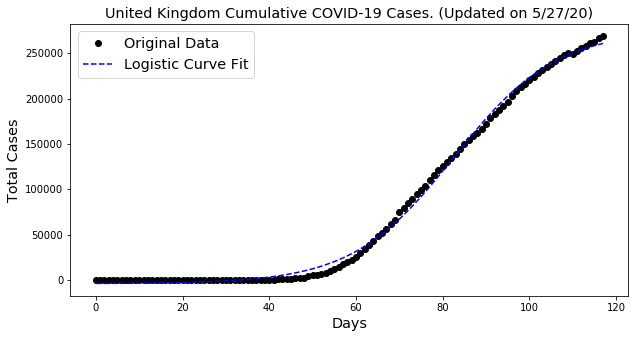



Spain

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 236259.0
	Confirmed cases on 5/20/20 	 232555.0
	Ratio: 1.02
	Weekly increase: 1.6 %
	Daily increase: 0.2 % per day
	Doubling Time (represents recent growth): 307.1 days

** Based on Logistic Fit**

	R^2: 0.9973707090160935
	Doubling Time (during middle of growth):  10.9 (± 0.48 ) days


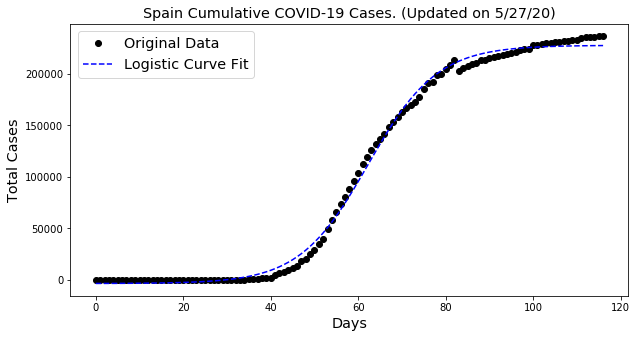



Italy

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 231139.0
	Confirmed cases on 5/20/20 	 227364.0
	Ratio: 1.02
	Weekly increase: 1.7 %
	Daily increase: 0.2 % per day
	Doubling Time (represents recent growth): 294.7 days

** Based on Logistic Fit**

	R^2: 0.9972635604029999
	Doubling Time (during middle of growth):  15.53 (± 0.67 ) days


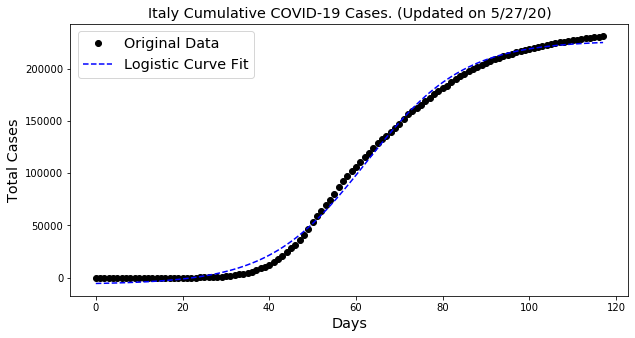



France

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 183038.0
	Confirmed cases on 5/20/20 	 181700.0
	Ratio: 1.01
	Weekly increase: 0.7 %
	Daily increase: 0.1 % per day
	Doubling Time (represents recent growth): 661.3 days

** Based on Logistic Fit**

	R^2: 0.9981029246259104
	Doubling Time (during middle of growth):  10.46 (± 0.39 ) days


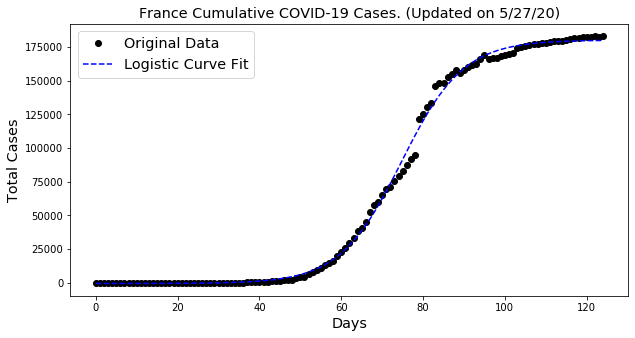



Germany

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 181524.0
	Confirmed cases on 5/20/20 	 178473.0
	Ratio: 1.02
	Weekly increase: 1.7 %
	Daily increase: 0.2 % per day
	Doubling Time (represents recent growth): 286.2 days

** Based on Logistic Fit**

	R^2: 0.9970634926079153
	Doubling Time (during middle of growth):  11.47 (± 0.52 ) days


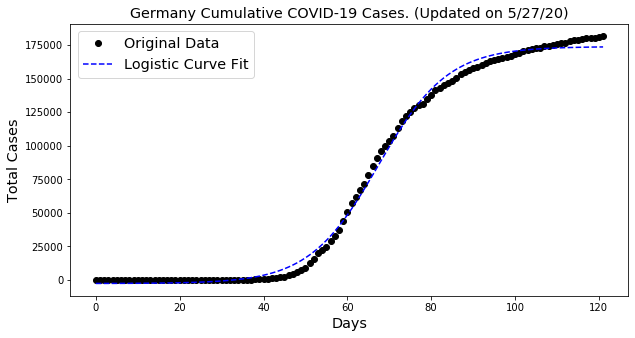



Turkey

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 159797.0
	Confirmed cases on 5/20/20 	 152587.0
	Ratio: 1.05
	Weekly increase: 4.7 %
	Daily increase: 0.7 % per day
	Doubling Time (represents recent growth): 105.1 days

** Based on Logistic Fit**

	R^2: 0.9974032880012693
	Doubling Time (during middle of growth):  13.67 (± 0.77 ) days


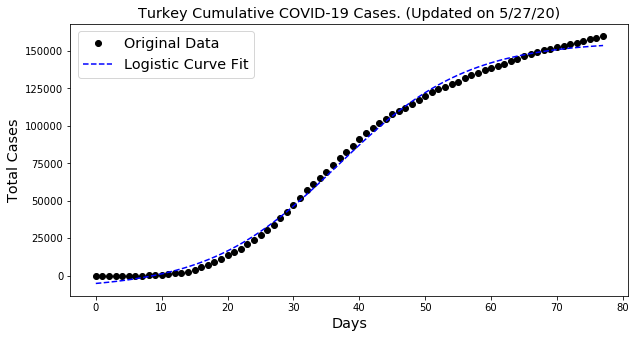



India

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 158086.0
	Confirmed cases on 5/20/20 	 112028.0
	Ratio: 1.41
	Weekly increase: 41.1 %
	Daily increase: 5.0 % per day
	Doubling Time (represents recent growth): 14.1 days

** Based on Logistic Fit**

	R^2: 0.999284129943424
	Doubling Time (during middle of growth):  19.51 (± 0.57 ) days

** Based on Exponential Fit **

	R^2: 0.9924561594980976
	Doubling Time (represents overall growth):  10.98 (± 0.37 ) days


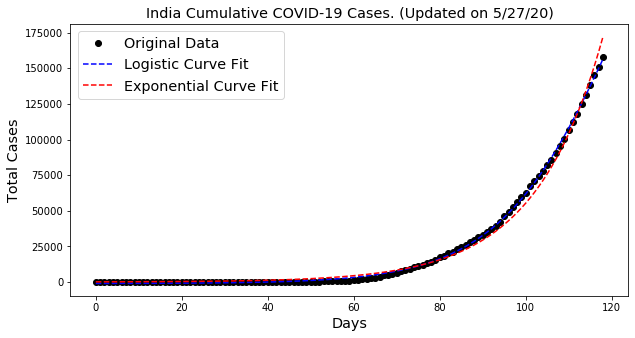



Iran

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 141591.0
	Confirmed cases on 5/20/20 	 126949.0
	Ratio: 1.12
	Weekly increase: 11.5 %
	Daily increase: 1.6 % per day
	Doubling Time (represents recent growth): 44.4 days

** Based on Logistic Fit**

	R^2: 0.9902565643822261
	Doubling Time (during middle of growth):  31.19 (± 4.81 ) days


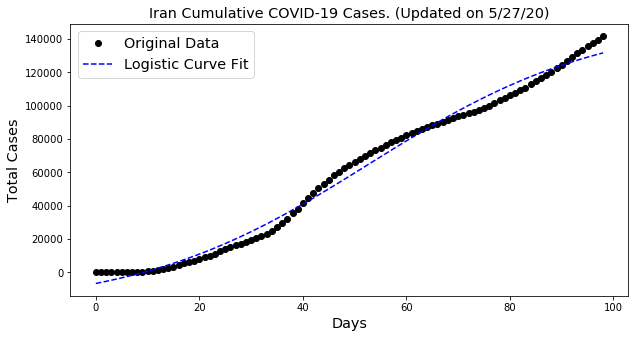



Peru

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 135905.0
	Confirmed cases on 5/20/20 	 104020.0
	Ratio: 1.31
	Weekly increase: 30.7 %
	Daily increase: 3.9 % per day
	Doubling Time (represents recent growth): 18.1 days

** Based on Logistic Fit**

	R^2: 0.9989881150099151
	Doubling Time (during middle of growth):  17.3 (± 0.73 ) days


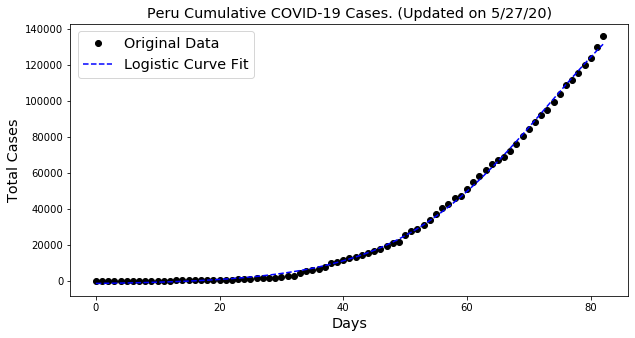



Canada

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 88989.0
	Confirmed cases on 5/20/20 	 81575.0
	Ratio: 1.09
	Weekly increase: 9.1 %
	Daily increase: 1.3 % per day
	Doubling Time (represents recent growth): 55.8 days

** Based on Logistic Fit**

	R^2: 0.9981910950145818
	Doubling Time (during middle of growth):  16.87 (± 0.61 ) days


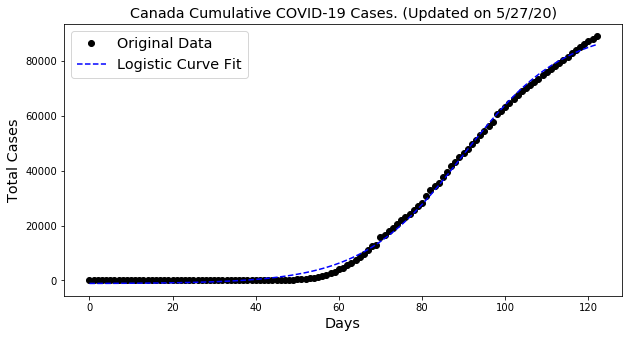



China

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 84106.0
	Confirmed cases on 5/20/20 	 84063.0
	Ratio: 1.0
	Weekly increase: 0.1 %
	Daily increase: 0.0 % per day
	Doubling Time (represents recent growth): 9487.9 days

** Based on Logistic Fit**

	R^2: 0.9950487548893324
	Doubling Time (during middle of growth):  7.0 (± 0.43 ) days


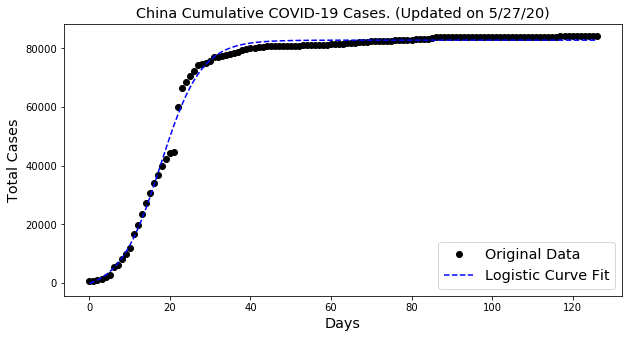



Chile

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 82289.0
	Confirmed cases on 5/20/20 	 53617.0
	Ratio: 1.53
	Weekly increase: 53.5 %
	Daily increase: 6.3 % per day
	Doubling Time (represents recent growth): 11.3 days

** Based on Logistic Fit**

	R^2: 0.9978168719960525
	Doubling Time (during middle of growth):  23.4 (± 0.52 ) days

** Based on Exponential Fit **

	R^2: 0.964167364783972
	Doubling Time (represents overall growth):  8.64 (± 0.73 ) days


C:\Users\barba\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in sqrt


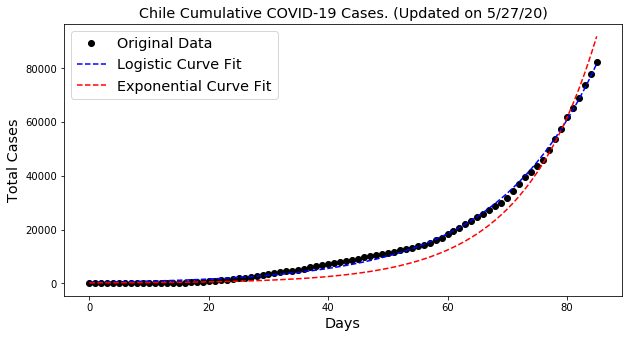



Saudi Arabia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 78541.0
	Confirmed cases on 5/20/20 	 62545.0
	Ratio: 1.26
	Weekly increase: 25.6 %
	Daily increase: 3.3 % per day
	Doubling Time (represents recent growth): 21.3 days

** Based on Logistic Fit**

	R^2: 0.9991514473885623
	Doubling Time (during middle of growth):  17.84 (± 0.67 ) days


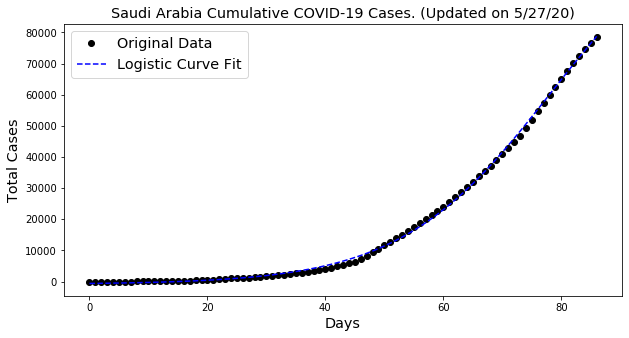



Mexico

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 78023.0
	Confirmed cases on 5/20/20 	 56594.0
	Ratio: 1.38
	Weekly increase: 37.9 %
	Daily increase: 4.7 % per day
	Doubling Time (represents recent growth): 15.1 days

** Based on Logistic Fit**

	R^2: 0.99945768135367
	Doubling Time (during middle of growth):  19.31 (± 0.61 ) days


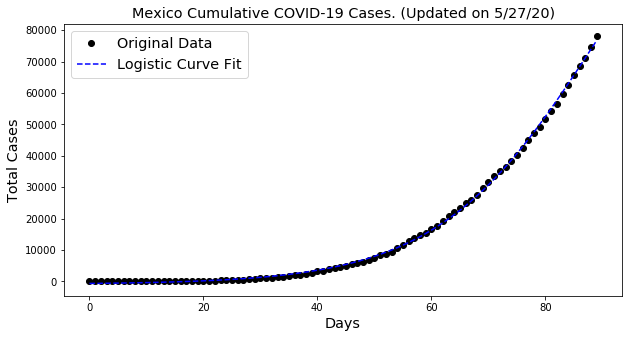



Pakistan

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 59151.0
	Confirmed cases on 5/20/20 	 45898.0
	Ratio: 1.29
	Weekly increase: 28.9 %
	Daily increase: 3.7 % per day
	Doubling Time (represents recent growth): 19.1 days

** Based on Logistic Fit**

	R^2: 0.9994408982082151
	Doubling Time (during middle of growth):  19.75 (± 0.61 ) days


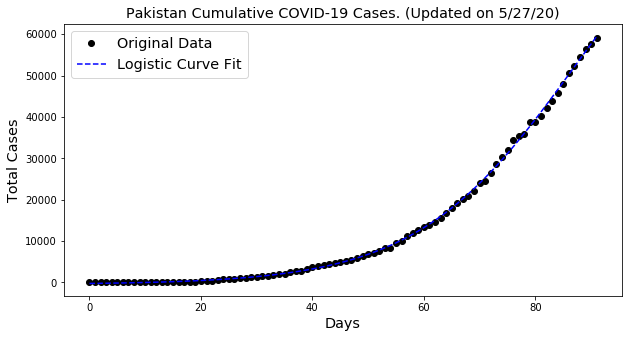



Belgium

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 57592.0
	Confirmed cases on 5/20/20 	 55983.0
	Ratio: 1.03
	Weekly increase: 2.9 %
	Daily increase: 0.4 % per day
	Doubling Time (represents recent growth): 171.2 days

** Based on Logistic Fit**

	R^2: 0.9983905617275465
	Doubling Time (during middle of growth):  12.95 (± 0.44 ) days


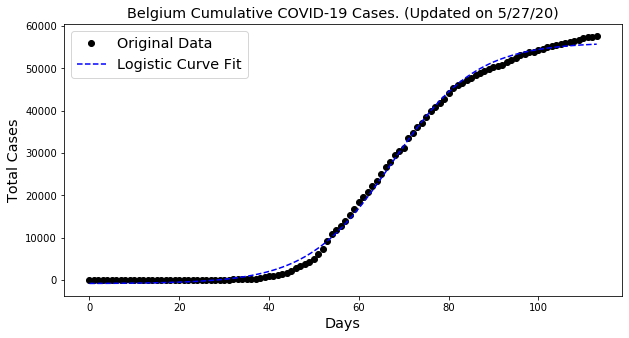



Qatar

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 48947.0
	Confirmed cases on 5/20/20 	 37097.0
	Ratio: 1.32
	Weekly increase: 31.9 %
	Daily increase: 4.0 % per day
	Doubling Time (represents recent growth): 17.5 days

** Based on Logistic Fit**

	R^2: 0.9992892477171015
	Doubling Time (during middle of growth):  18.76 (± 0.66 ) days

** Based on Exponential Fit **

	R^2: 0.9527935860962925
	Doubling Time (represents overall growth):  9.56 (± 0.95 ) days


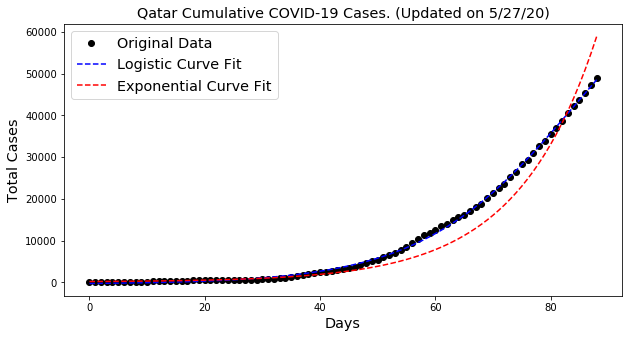



Netherlands

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 45970.0
	Confirmed cases on 5/20/20 	 44647.0
	Ratio: 1.03
	Weekly increase: 3.0 %
	Daily increase: 0.4 % per day
	Doubling Time (represents recent growth): 166.2 days

** Based on Logistic Fit**

	R^2: 0.9990033621152582
	Doubling Time (during middle of growth):  14.07 (± 0.43 ) days


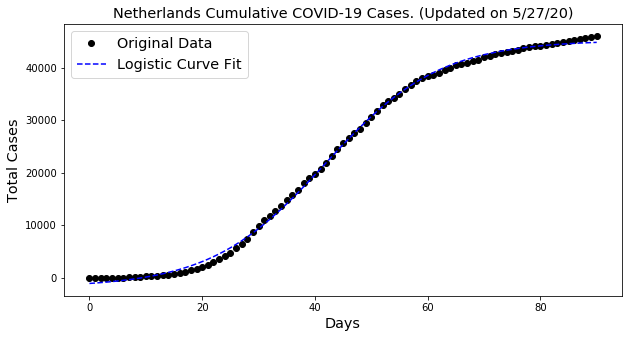



Belarus

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 38956.0
	Confirmed cases on 5/20/20 	 32426.0
	Ratio: 1.2
	Weekly increase: 20.1 %
	Daily increase: 2.7 % per day
	Doubling Time (represents recent growth): 26.4 days

** Based on Logistic Fit**

	R^2: 0.9984858833855083
	Doubling Time (during middle of growth):  15.02 (± 0.64 ) days


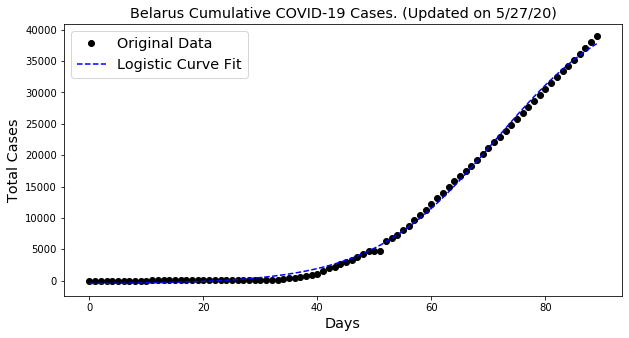



Bangladesh

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 38292.0
	Confirmed cases on 5/20/20 	 26738.0
	Ratio: 1.43
	Weekly increase: 43.2 %
	Daily increase: 5.3 % per day
	Doubling Time (represents recent growth): 13.5 days

** Based on Logistic Fit**

	R^2: 0.9985066321851281
	Doubling Time (during middle of growth):  17.56 (± 0.99 ) days

** Based on Exponential Fit **

	R^2: 0.9794616948040469
	Doubling Time (represents overall growth):  9.12 (± 0.65 ) days


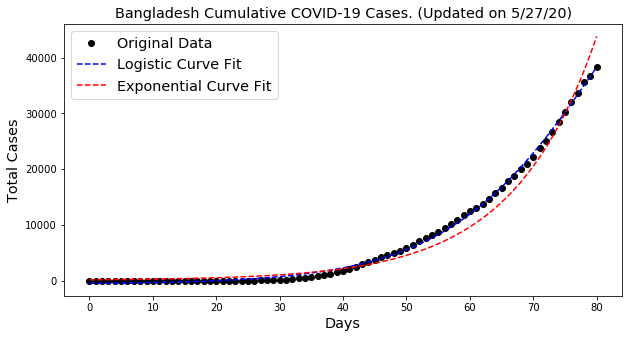



Ecuador

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 38103.0
	Confirmed cases on 5/20/20 	 34854.0
	Ratio: 1.09
	Weekly increase: 9.3 %
	Daily increase: 1.3 % per day
	Doubling Time (represents recent growth): 54.4 days

** Based on Logistic Fit**

	R^2: 0.984078340260846
	Doubling Time (during middle of growth):  10.3 (± 1.27 ) days


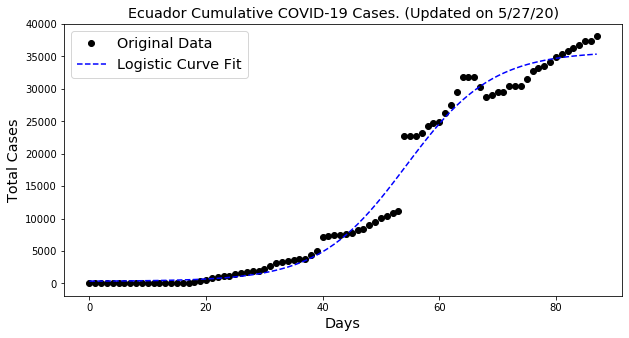



Sweden

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 35088.0
	Confirmed cases on 5/20/20 	 31523.0
	Ratio: 1.11
	Weekly increase: 11.3 %
	Daily increase: 1.5 % per day
	Doubling Time (represents recent growth): 45.3 days

** Based on Logistic Fit**

	R^2: 0.9982792605477655
	Doubling Time (during middle of growth):  20.75 (± 0.81 ) days


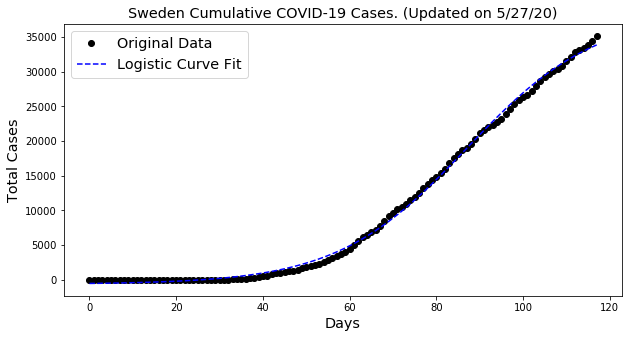



Singapore

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 32876.0
	Confirmed cases on 5/20/20 	 29364.0
	Ratio: 1.12
	Weekly increase: 12.0 %
	Daily increase: 1.6 % per day
	Doubling Time (represents recent growth): 42.9 days

** Based on Logistic Fit**

	R^2: 0.9970378283657638
	Doubling Time (during middle of growth):  13.02 (± 0.59 ) days


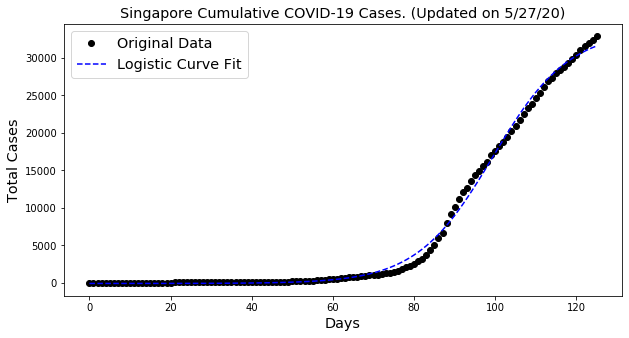



United Arab Emirates

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 31969.0
	Confirmed cases on 5/20/20 	 26004.0
	Ratio: 1.23
	Weekly increase: 22.9 %
	Daily increase: 3.0 % per day
	Doubling Time (represents recent growth): 23.5 days

** Based on Logistic Fit**

	R^2: 0.9972186508204565
	Doubling Time (during middle of growth):  20.25 (± 1.07 ) days

** Based on Exponential Fit **

	R^2: 0.9742895792727531
	Doubling Time (represents overall growth):  13.95 (± 0.93 ) days


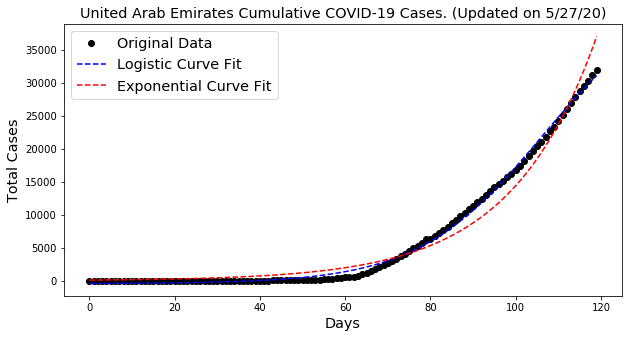



Portugal

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 31292.0
	Confirmed cases on 5/20/20 	 29660.0
	Ratio: 1.06
	Weekly increase: 5.5 %
	Daily increase: 0.8 % per day
	Doubling Time (represents recent growth): 90.6 days

** Based on Logistic Fit**

	R^2: 0.9955927194474401
	Doubling Time (during middle of growth):  15.53 (± 1.08 ) days


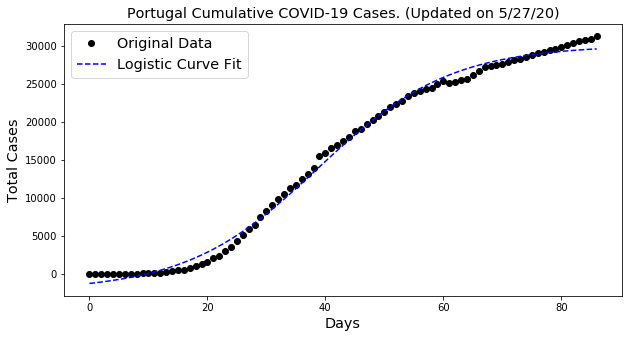



Switzerland

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 30776.0
	Confirmed cases on 5/20/20 	 30658.0
	Ratio: 1.0
	Weekly increase: 0.4 %
	Daily increase: 0.1 % per day
	Doubling Time (represents recent growth): 1263.0 days

** Based on Logistic Fit**

	R^2: 0.9978920174789377
	Doubling Time (during middle of growth):  10.54 (± 0.46 ) days


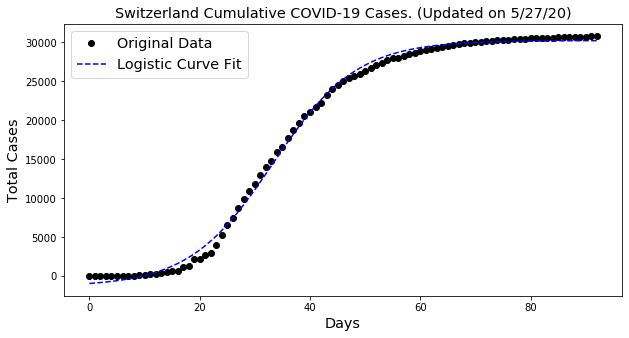



South Africa

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 25937.0
	Confirmed cases on 5/20/20 	 18003.0
	Ratio: 1.44
	Weekly increase: 44.1 %
	Daily increase: 5.4 % per day
	Doubling Time (represents recent growth): 13.3 days

** Based on Logistic Fit**

	R^2: 0.9987895739506001
	Doubling Time (during middle of growth):  25.19 (± 1.73 ) days

** Based on Exponential Fit **

	R^2: 0.9851157135232469
	Doubling Time (represents overall growth):  10.19 (± 0.6 ) days


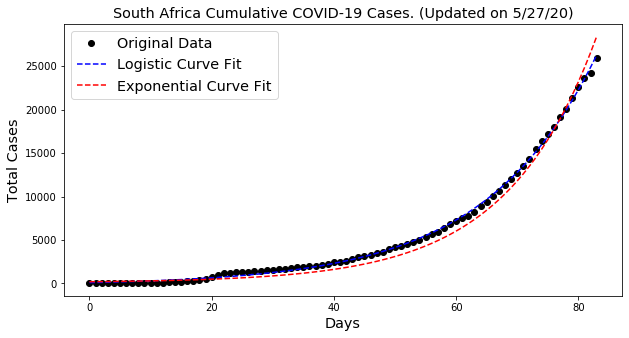



Ireland

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 24803.0
	Confirmed cases on 5/20/20 	 24315.0
	Ratio: 1.02
	Weekly increase: 2.0 %
	Daily increase: 0.3 % per day
	Doubling Time (represents recent growth): 244.2 days

** Based on Logistic Fit**

	R^2: 0.9990215340884601
	Doubling Time (during middle of growth):  11.56 (± 0.35 ) days


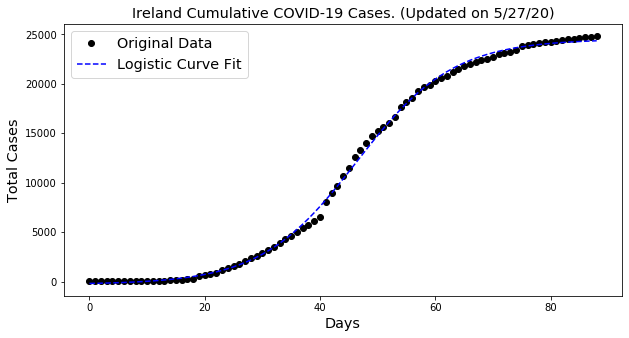



Colombia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 24104.0
	Confirmed cases on 5/20/20 	 17687.0
	Ratio: 1.36
	Weekly increase: 36.3 %
	Daily increase: 4.5 % per day
	Doubling Time (represents recent growth): 15.7 days

** Based on Logistic Fit**

	R^2: 0.9995140096870516
	Doubling Time (during middle of growth):  28.35 (± 1.36 ) days

** Based on Exponential Fit **

	R^2: 0.9502686932282218
	Doubling Time (represents overall growth):  10.09 (± 1.08 ) days


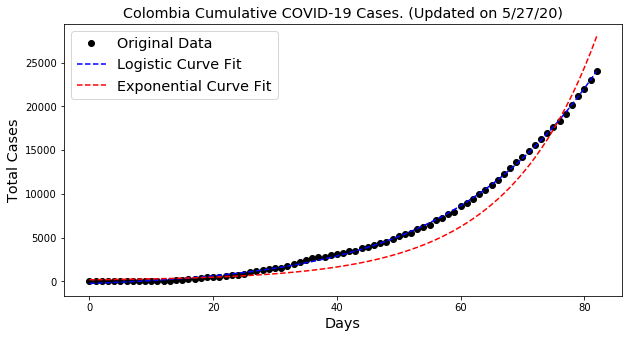



Indonesia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 23851.0
	Confirmed cases on 5/20/20 	 19189.0
	Ratio: 1.24
	Weekly increase: 24.3 %
	Daily increase: 3.2 % per day
	Doubling Time (represents recent growth): 22.3 days

** Based on Logistic Fit**

	R^2: 0.9974472875252082
	Doubling Time (during middle of growth):  30.62 (± 3.17 ) days


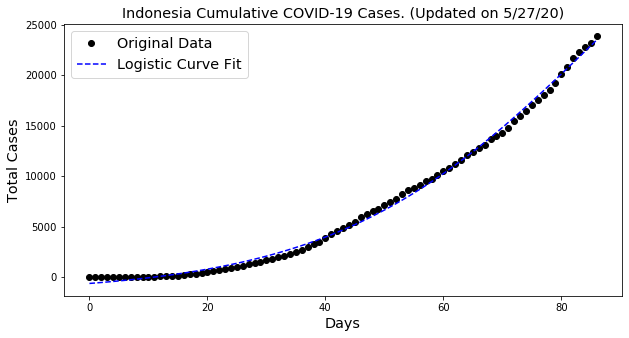



Kuwait

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 23267.0
	Confirmed cases on 5/20/20 	 17568.0
	Ratio: 1.32
	Weekly increase: 32.4 %
	Daily increase: 4.1 % per day
	Doubling Time (represents recent growth): 17.3 days

** Based on Logistic Fit**

	R^2: 0.9986114202440863
	Doubling Time (during middle of growth):  14.22 (± 0.61 ) days

** Based on Exponential Fit **

	R^2: 0.993040396501033
	Doubling Time (represents overall growth):  10.83 (± 0.42 ) days


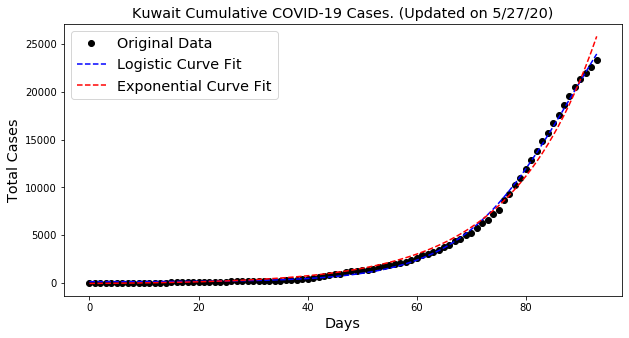



Poland

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 22473.0
	Confirmed cases on 5/20/20 	 19739.0
	Ratio: 1.14
	Weekly increase: 13.9 %
	Daily increase: 1.9 % per day
	Doubling Time (represents recent growth): 37.4 days

** Based on Logistic Fit**

	R^2: 0.9963275699180077
	Doubling Time (during middle of growth):  26.07 (± 2.62 ) days


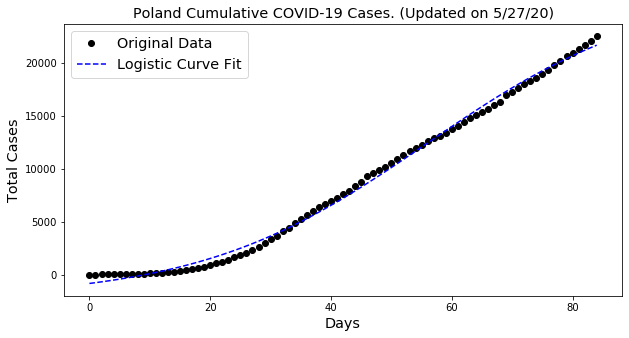



Ukraine

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 21905.0
	Confirmed cases on 5/20/20 	 19230.0
	Ratio: 1.14
	Weekly increase: 13.9 %
	Daily increase: 1.9 % per day
	Doubling Time (represents recent growth): 37.3 days

** Based on Logistic Fit**

	R^2: 0.9988694267339279
	Doubling Time (during middle of growth):  16.24 (± 0.62 ) days


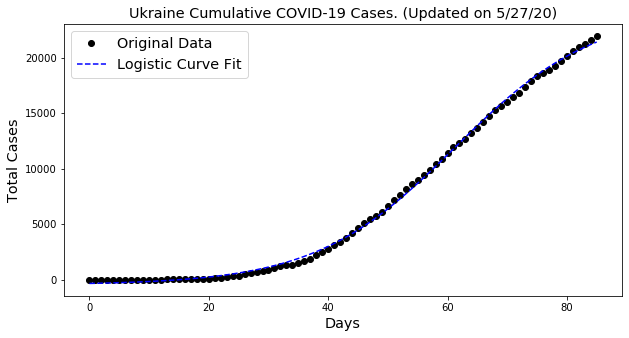



Egypt

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 19666.0
	Confirmed cases on 5/20/20 	 14229.0
	Ratio: 1.38
	Weekly increase: 38.2 %
	Daily increase: 4.7 % per day
	Doubling Time (represents recent growth): 15.0 days

** Based on Logistic Fit**

	R^2: 0.9991535302476106
	Doubling Time (during middle of growth):  26.17 (± 1.12 ) days

** Based on Exponential Fit **

	R^2: 0.9951523748209332
	Doubling Time (represents overall growth):  13.39 (± 0.42 ) days


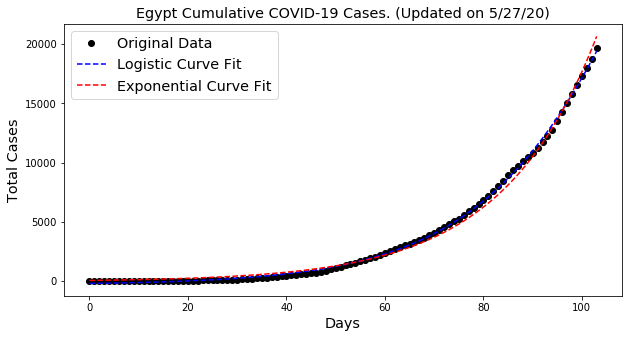



Romania

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 18594.0
	Confirmed cases on 5/20/20 	 17387.0
	Ratio: 1.07
	Weekly increase: 6.9 %
	Daily increase: 1.0 % per day
	Doubling Time (represents recent growth): 72.3 days

** Based on Logistic Fit**

	R^2: 0.9979543892254578
	Doubling Time (during middle of growth):  18.18 (± 0.89 ) days


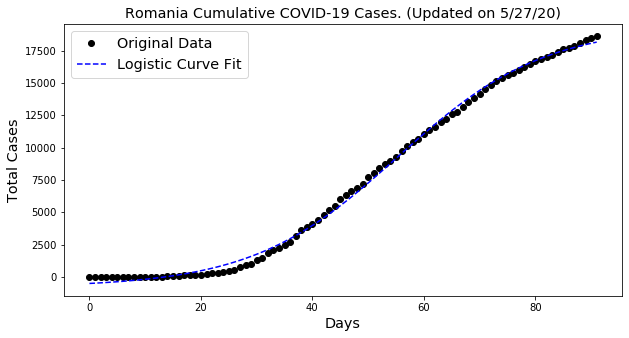



Israel

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 16793.0
	Confirmed cases on 5/20/20 	 16667.0
	Ratio: 1.01
	Weekly increase: 0.8 %
	Daily increase: 0.1 % per day
	Doubling Time (represents recent growth): 644.2 days

** Based on Logistic Fit**

	R^2: 0.9973411578473576
	Doubling Time (during middle of growth):  10.53 (± 0.5 ) days


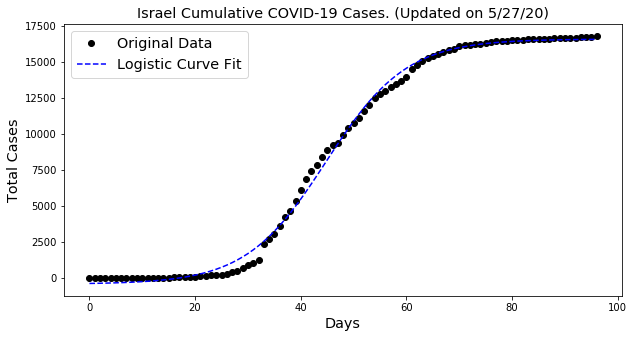



Japan

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 16651.0
	Confirmed cases on 5/20/20 	 16367.0
	Ratio: 1.02
	Weekly increase: 1.7 %
	Daily increase: 0.2 % per day
	Doubling Time (represents recent growth): 282.0 days

** Based on Logistic Fit**

	R^2: 0.998958216382785
	Doubling Time (during middle of growth):  10.59 (± 0.29 ) days


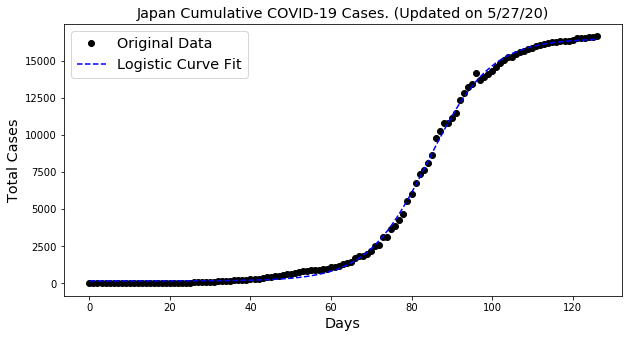



Austria

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 16591.0
	Confirmed cases on 5/20/20 	 16353.0
	Ratio: 1.01
	Weekly increase: 1.5 %
	Daily increase: 0.2 % per day
	Doubling Time (represents recent growth): 335.8 days

** Based on Logistic Fit**

	R^2: 0.9954669043850027
	Doubling Time (during middle of growth):  8.74 (± 0.57 ) days


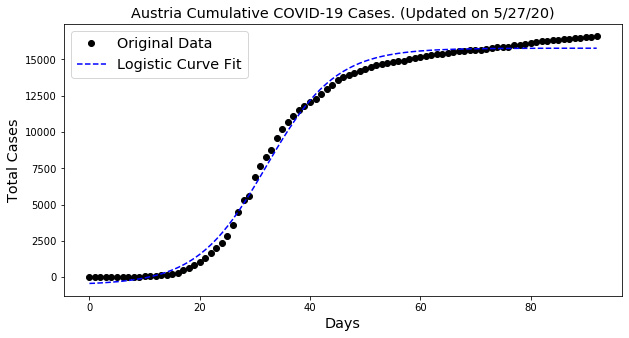



Dominican Republic

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 15723.0
	Confirmed cases on 5/20/20 	 13477.0
	Ratio: 1.17
	Weekly increase: 16.7 %
	Daily increase: 2.2 % per day
	Doubling Time (represents recent growth): 31.5 days

** Based on Logistic Fit**

	R^2: 0.9983714376748289
	Doubling Time (during middle of growth):  24.59 (± 1.52 ) days


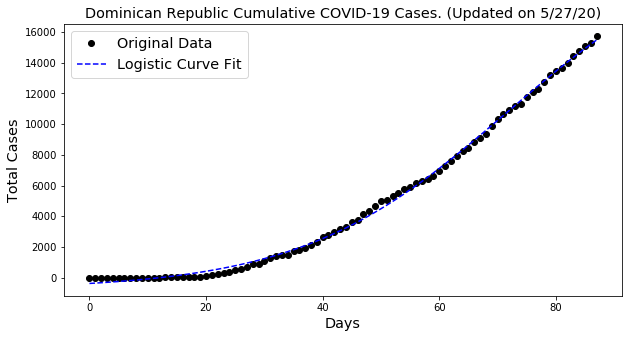



Philippines

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 15049.0
	Confirmed cases on 5/20/20 	 13221.0
	Ratio: 1.14
	Weekly increase: 13.8 %
	Daily increase: 1.9 % per day
	Doubling Time (represents recent growth): 37.5 days

** Based on Logistic Fit**

	R^2: 0.9939082893255602
	Doubling Time (during middle of growth):  21.48 (± 1.59 ) days


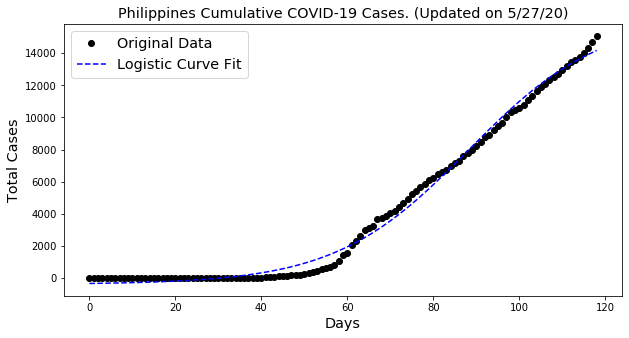



Argentina

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 13933.0
	Confirmed cases on 5/20/20 	 9283.0
	Ratio: 1.5
	Weekly increase: 50.1 %
	Daily increase: 6.0 % per day
	Doubling Time (represents recent growth): 11.9 days

** Based on Logistic Fit**

	R^2: 0.9918538649954097
	Doubling Time (during middle of growth):  35.43 (± 2.64 ) days

** Based on Exponential Fit **

	R^2: 0.956809261343805
	Doubling Time (represents overall growth):  11.8 (± 1.2 ) days


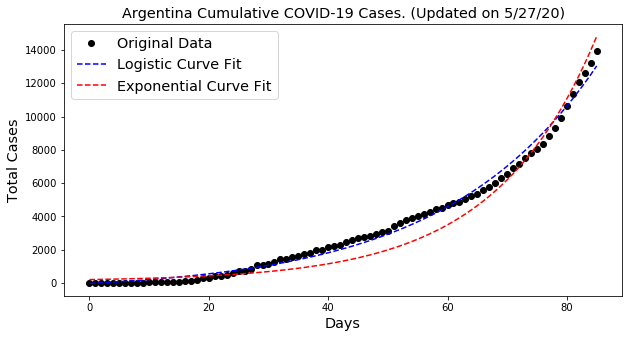



Afghanistan

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 12456.0
	Confirmed cases on 5/20/20 	 8145.0
	Ratio: 1.53
	Weekly increase: 52.9 %
	Daily increase: 6.3 % per day
	Doubling Time (represents recent growth): 11.4 days

** Based on Logistic Fit**

	R^2: 0.9997183147660614
	Doubling Time (during middle of growth):  19.73 (± 0.47 ) days

** Based on Exponential Fit **

	R^2: 0.9994354399703534
	Doubling Time (represents overall growth):  10.92 (± 0.12 ) days


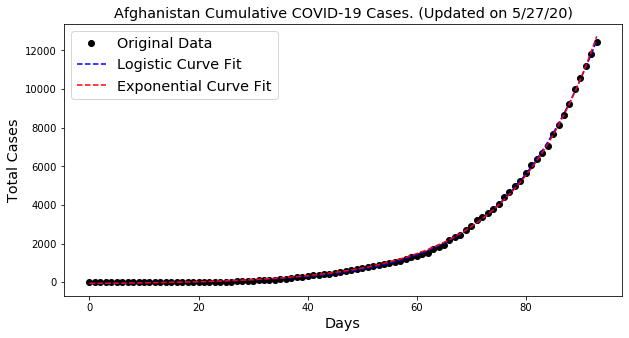



Panama

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 11728.0
	Confirmed cases on 5/20/20 	 9977.0
	Ratio: 1.18
	Weekly increase: 17.6 %
	Daily increase: 2.3 % per day
	Doubling Time (represents recent growth): 30.0 days

** Based on Logistic Fit**

	R^2: 0.9980420856463387
	Doubling Time (during middle of growth):  24.87 (± 1.94 ) days


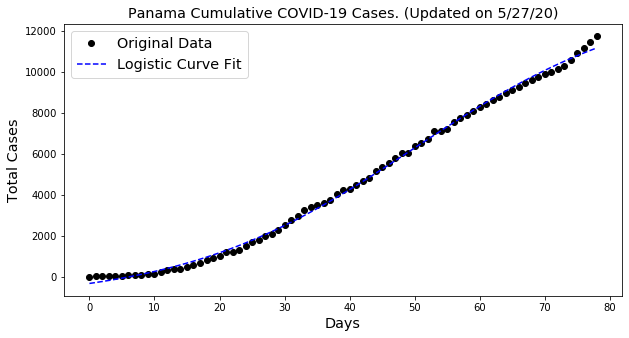



Denmark

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 11680.0
	Confirmed cases on 5/20/20 	 11315.0
	Ratio: 1.03
	Weekly increase: 3.2 %
	Daily increase: 0.5 % per day
	Doubling Time (represents recent growth): 152.8 days

** Based on Logistic Fit**

	R^2: 0.9978611799476846
	Doubling Time (during middle of growth):  18.36 (± 0.92 ) days


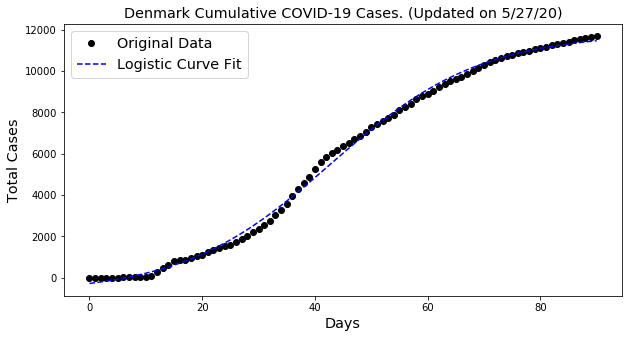



Korea, South

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 11344.0
	Confirmed cases on 5/20/20 	 11122.0
	Ratio: 1.02
	Weekly increase: 2.0 %
	Daily increase: 0.3 % per day
	Doubling Time (represents recent growth): 245.5 days

** Based on Logistic Fit**

	R^2: 0.9878633956083102
	Doubling Time (during middle of growth):  9.65 (± 0.92 ) days


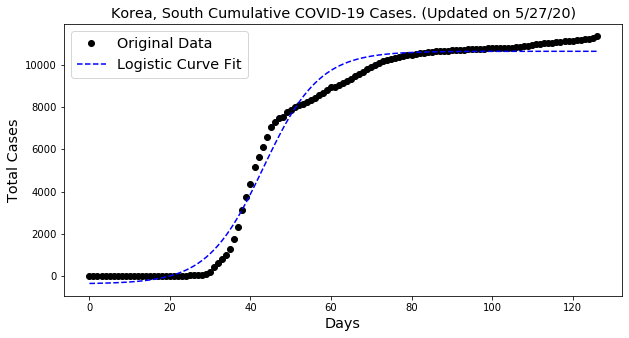



Serbia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 11275.0
	Confirmed cases on 5/20/20 	 10833.0
	Ratio: 1.04
	Weekly increase: 4.1 %
	Daily increase: 0.6 % per day
	Doubling Time (represents recent growth): 121.3 days

** Based on Logistic Fit**

	R^2: 0.9987134494170083
	Doubling Time (during middle of growth):  11.74 (± 0.42 ) days


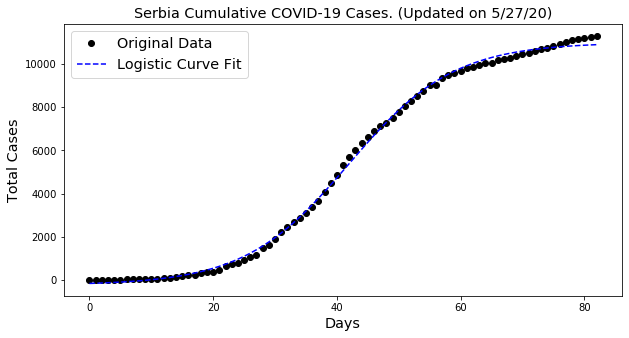



Bahrain

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 9692.0
	Confirmed cases on 5/20/20 	 7888.0
	Ratio: 1.23
	Weekly increase: 22.9 %
	Daily increase: 3.0 % per day
	Doubling Time (represents recent growth): 23.6 days

** Based on Logistic Fit**

	R^2: 0.9982542022673051
	Doubling Time (during middle of growth):  23.86 (± 1.48 ) days

** Based on Exponential Fit **

	R^2: 0.9906167671322773
	Doubling Time (represents overall growth):  13.78 (± 0.67 ) days


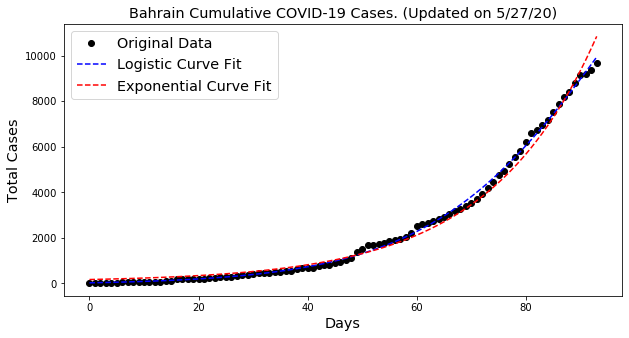



Kazakhstan

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 9304.0
	Confirmed cases on 5/20/20 	 6969.0
	Ratio: 1.34
	Weekly increase: 33.5 %
	Daily increase: 4.2 % per day
	Doubling Time (represents recent growth): 16.8 days

** Based on Logistic Fit**

	R^2: 0.9960539666050581
	Doubling Time (during middle of growth):  29.49 (± 4.68 ) days


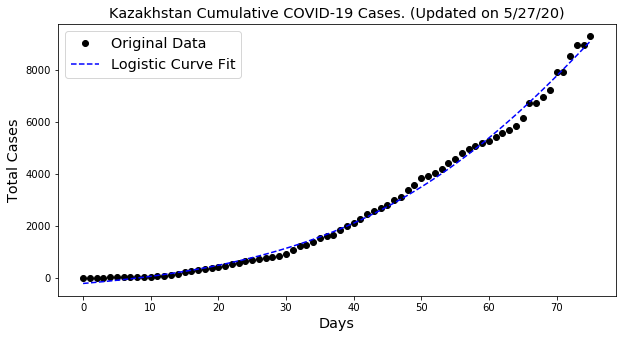



Czechia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 9086.0
	Confirmed cases on 5/20/20 	 8721.0
	Ratio: 1.04
	Weekly increase: 4.2 %
	Daily increase: 0.6 % per day
	Doubling Time (represents recent growth): 118.3 days

** Based on Logistic Fit**

	R^2: 0.9941412529491921
	Doubling Time (during middle of growth):  14.13 (± 1.1 ) days


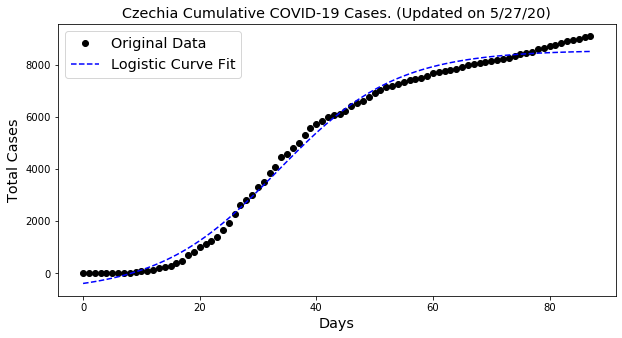



Algeria

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 8857.0
	Confirmed cases on 5/20/20 	 7542.0
	Ratio: 1.17
	Weekly increase: 17.4 %
	Daily increase: 2.3 % per day
	Doubling Time (represents recent growth): 30.2 days

** Based on Logistic Fit**

	R^2: 0.998100522942825
	Doubling Time (during middle of growth):  27.2 (± 1.87 ) days


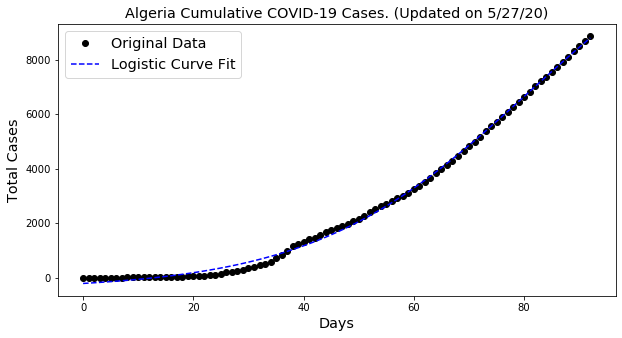



Nigeria

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 8733.0
	Confirmed cases on 5/20/20 	 6677.0
	Ratio: 1.31
	Weekly increase: 30.8 %
	Daily increase: 3.9 % per day
	Doubling Time (represents recent growth): 18.1 days

** Based on Logistic Fit**

	R^2: 0.998623431183612
	Doubling Time (during middle of growth):  13.26 (± 0.54 ) days

** Based on Exponential Fit **

	R^2: 0.9825594713866935
	Doubling Time (represents overall growth):  12.5 (± 0.85 ) days


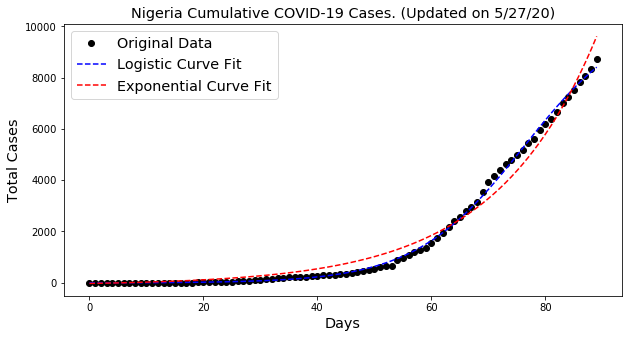



Norway

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 8401.0
	Confirmed cases on 5/20/20 	 8281.0
	Ratio: 1.01
	Weekly increase: 1.4 %
	Daily increase: 0.2 % per day
	Doubling Time (represents recent growth): 337.3 days

** Based on Logistic Fit**

	R^2: 0.997252356776358
	Doubling Time (during middle of growth):  13.97 (± 0.72 ) days


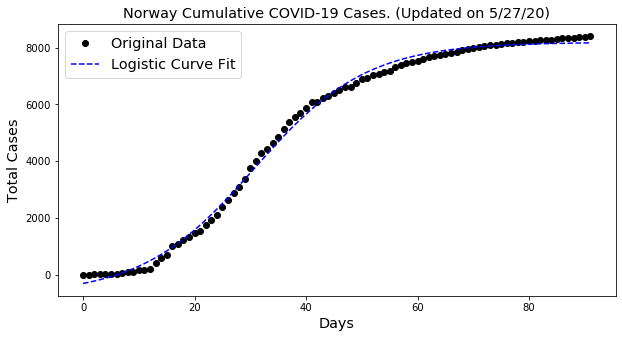



Oman

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 8373.0
	Confirmed cases on 5/20/20 	 6043.0
	Ratio: 1.39
	Weekly increase: 38.6 %
	Daily increase: 4.8 % per day
	Doubling Time (represents recent growth): 14.9 days

** Based on Logistic Fit**

	R^2: 0.9959901639314037
	Doubling Time (during middle of growth):  28.15 (± 3.3 ) days

** Based on Exponential Fit **

	R^2: 0.9953814563186734
	Doubling Time (represents overall growth):  13.54 (± 0.46 ) days


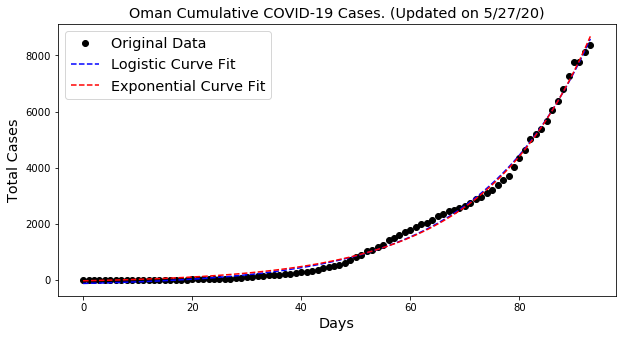



Armenia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 7774.0
	Confirmed cases on 5/20/20 	 5271.0
	Ratio: 1.47
	Weekly increase: 47.5 %
	Daily increase: 5.7 % per day
	Doubling Time (represents recent growth): 12.5 days

** Based on Logistic Fit**

	R^2: 0.9962703513038407
	Doubling Time (during middle of growth):  29.81 (± 0.98 ) days

** Based on Exponential Fit **

	R^2: 0.9955823538385196
	Doubling Time (represents overall growth):  13.9 (± 0.5 ) days


C:\Users\barba\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in sqrt


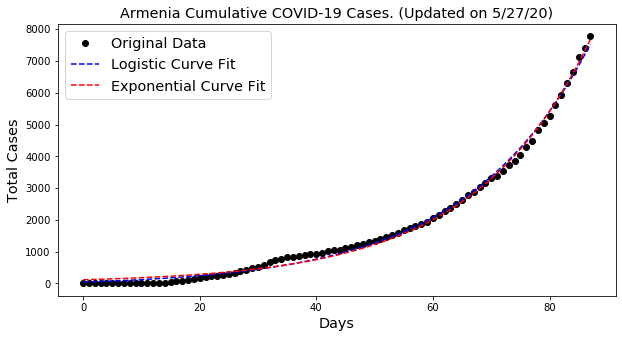



Bolivia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 7768.0
	Confirmed cases on 5/20/20 	 4919.0
	Ratio: 1.58
	Weekly increase: 57.9 %
	Daily increase: 6.7 % per day
	Doubling Time (represents recent growth): 10.6 days

** Based on Logistic Fit**

	R^2: 0.9995157169305545
	Doubling Time (during middle of growth):  19.47 (± 0.74 ) days

** Based on Exponential Fit **

	R^2: 0.9993200081972718
	Doubling Time (represents overall growth):  10.77 (± 0.15 ) days


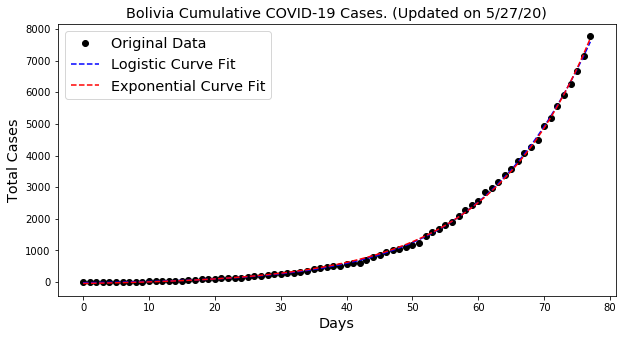



Malaysia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 7619.0
	Confirmed cases on 5/20/20 	 7009.0
	Ratio: 1.09
	Weekly increase: 8.7 %
	Daily increase: 1.2 % per day
	Doubling Time (represents recent growth): 58.1 days

** Based on Logistic Fit**

	R^2: 0.9947808254096661
	Doubling Time (during middle of growth):  14.89 (± 0.87 ) days


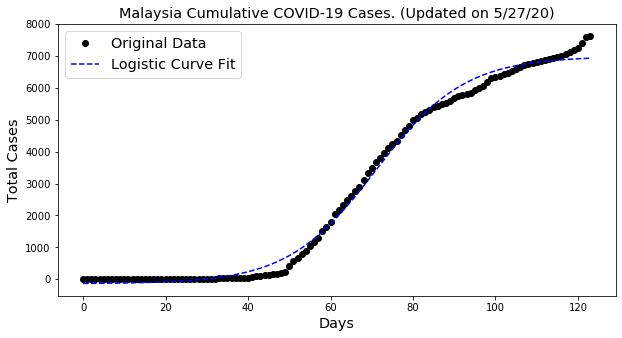



Morocco

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 7601.0
	Confirmed cases on 5/20/20 	 7133.0
	Ratio: 1.07
	Weekly increase: 6.6 %
	Daily increase: 0.9 % per day
	Doubling Time (represents recent growth): 76.4 days

** Based on Logistic Fit**

	R^2: 0.9987142933877414
	Doubling Time (during middle of growth):  17.08 (± 0.69 ) days


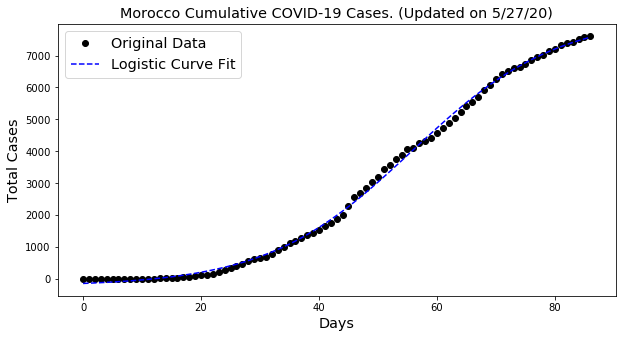



Moldova

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 7537.0
	Confirmed cases on 5/20/20 	 6553.0
	Ratio: 1.15
	Weekly increase: 15.0 %
	Daily increase: 2.0 % per day
	Doubling Time (represents recent growth): 34.7 days

** Based on Logistic Fit**

	R^2: 0.9908536804837292
	Doubling Time (during middle of growth):  -76.96 (± -18.17 ) days


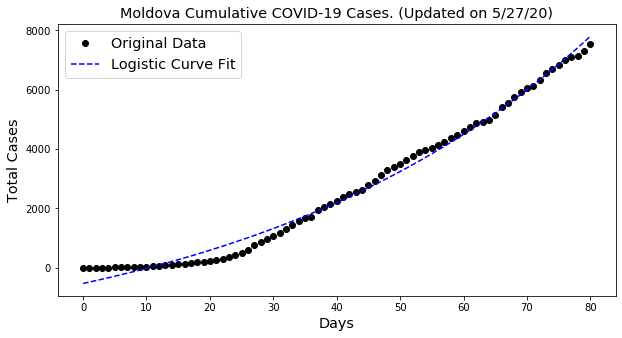



Ghana

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 7303.0
	Confirmed cases on 5/20/20 	 6269.0
	Ratio: 1.16
	Weekly increase: 16.5 %
	Daily increase: 2.2 % per day
	Doubling Time (represents recent growth): 31.8 days

** Based on Logistic Fit**

	R^2: 0.994751324070102
	Doubling Time (during middle of growth):  11.31 (± 0.93 ) days


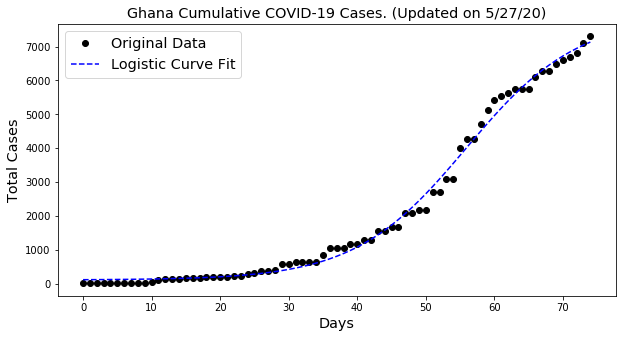



Australia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 7150.0
	Confirmed cases on 5/20/20 	 7081.0
	Ratio: 1.01
	Weekly increase: 1.0 %
	Daily increase: 0.1 % per day
	Doubling Time (represents recent growth): 500.4 days

** Based on Logistic Fit**

	R^2: 0.9981552976010679
	Doubling Time (during middle of growth):  6.72 (± 0.29 ) days


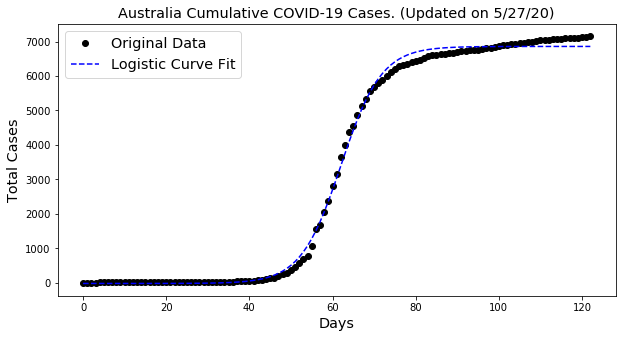



Finland

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 6692.0
	Confirmed cases on 5/20/20 	 6443.0
	Ratio: 1.04
	Weekly increase: 3.9 %
	Daily increase: 0.5 % per day
	Doubling Time (represents recent growth): 128.0 days

** Based on Logistic Fit**

	R^2: 0.9983589723583163
	Doubling Time (during middle of growth):  17.39 (± 0.6 ) days


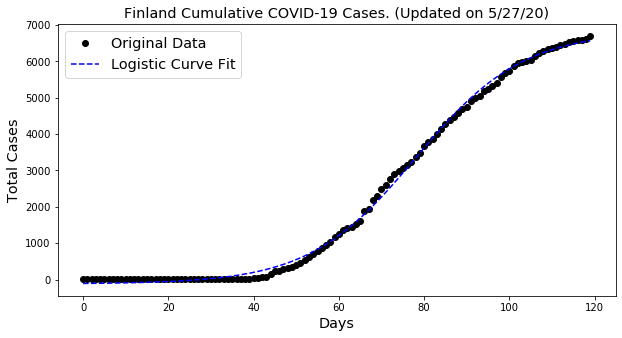



Cameroon

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 5436.0
	Confirmed cases on 5/20/20 	 3733.0
	Ratio: 1.46
	Weekly increase: 45.6 %
	Daily increase: 5.5 % per day
	Doubling Time (represents recent growth): 12.9 days

** Based on Logistic Fit**

	R^2: 0.9907630337333251
	Doubling Time (during middle of growth):  37.85 (± 3.22 ) days

** Based on Exponential Fit **

	R^2: 0.9810043764656395
	Doubling Time (represents overall growth):  14.16 (± 1.14 ) days


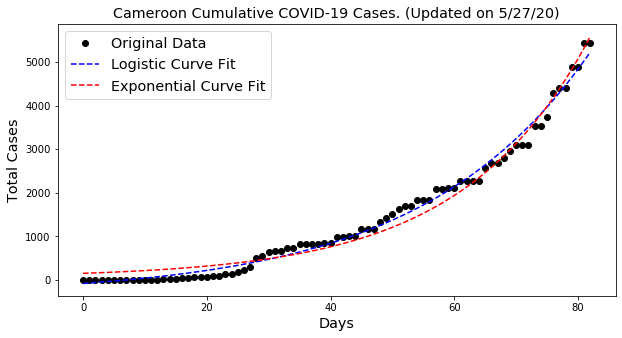



Iraq

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 5135.0
	Confirmed cases on 5/20/20 	 3724.0
	Ratio: 1.38
	Weekly increase: 37.9 %
	Daily increase: 4.7 % per day
	Doubling Time (represents recent growth): 15.1 days

** Based on Logistic Fit**

	R^2: 0.9914727844527059
	Doubling Time (during middle of growth):  56.14 (± 4.34 ) days

** Based on Exponential Fit **

	R^2: 0.9613221327937856
	Doubling Time (represents overall growth):  16.3 (± 1.74 ) days


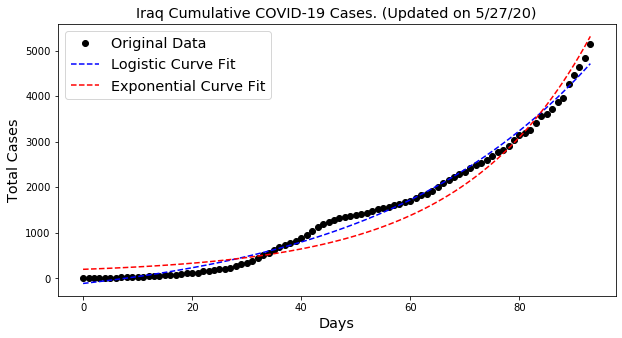



Honduras

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 4640.0
	Confirmed cases on 5/20/20 	 2955.0
	Ratio: 1.57
	Weekly increase: 57.0 %
	Daily increase: 6.7 % per day
	Doubling Time (represents recent growth): 10.8 days

** Based on Logistic Fit**

	R^2: 0.99393624884472
	Doubling Time (during middle of growth):  21.13 (± 2.96 ) days

** Based on Exponential Fit **

	R^2: 0.9935842703789747
	Doubling Time (represents overall growth):  12.52 (± 0.58 ) days


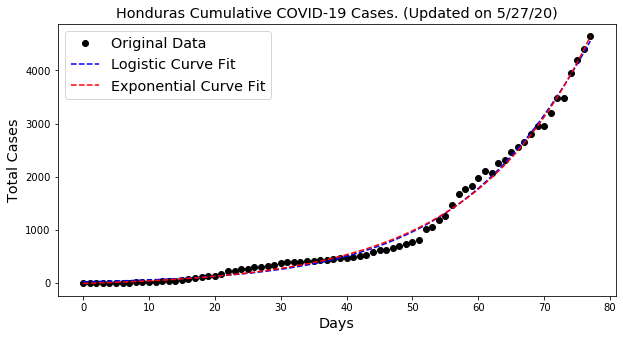



Azerbaijan

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 4568.0
	Confirmed cases on 5/20/20 	 3631.0
	Ratio: 1.26
	Weekly increase: 25.8 %
	Daily increase: 3.3 % per day
	Doubling Time (represents recent growth): 21.1 days

** Based on Logistic Fit**

	R^2: 0.9905417710726565
	Doubling Time (during middle of growth):  52.56 (± nan ) days

** Based on Exponential Fit **

	R^2: 0.9627496477485568
	Doubling Time (represents overall growth):  15.53 (± 1.74 ) days


C:\Users\barba\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in sqrt


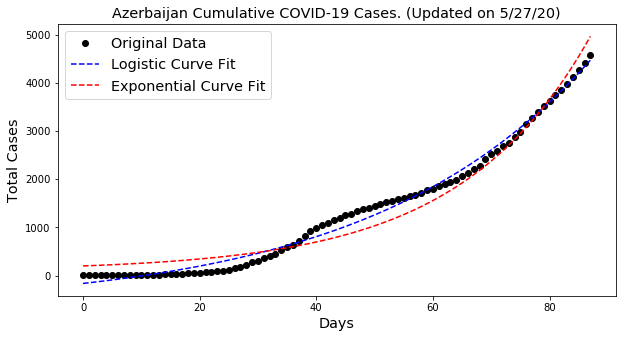



Sudan

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 4346.0
	Confirmed cases on 5/20/20 	 2728.0
	Ratio: 1.59
	Weekly increase: 59.3 %
	Daily increase: 6.9 % per day
	Doubling Time (represents recent growth): 10.4 days

** Based on Logistic Fit**

	R^2: 0.9983339857482371
	Doubling Time (during middle of growth):  11.47 (± 0.59 ) days

** Based on Exponential Fit **

	R^2: 0.9906818246932851
	Doubling Time (represents overall growth):  9.48 (± 0.49 ) days


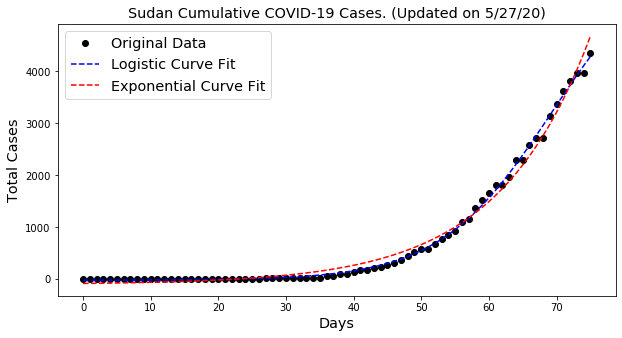



Guatemala

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 4145.0
	Confirmed cases on 5/20/20 	 2265.0
	Ratio: 1.83
	Weekly increase: 83.0 %
	Daily increase: 9.0 % per day
	Doubling Time (represents recent growth): 8.0 days

** Based on Logistic Fit**

	R^2: 0.996086660110681
	Doubling Time (during middle of growth):  17.38 (± inf ) days

** Based on Exponential Fit **

	R^2: 0.9960866603577039
	Doubling Time (represents overall growth):  8.69 (± 0.28 ) days


C:\OSGEO4~1\apps\Python37\lib\site-packages\scipy\optimize\minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


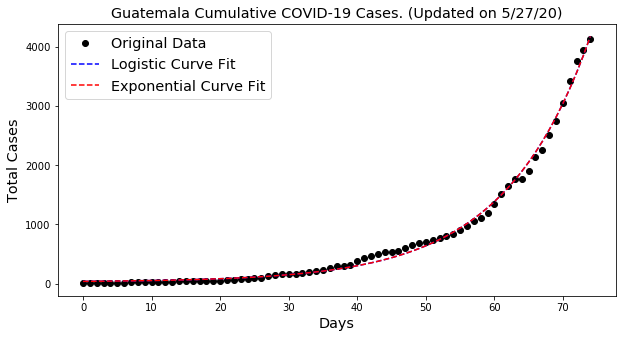



Luxembourg

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 4001.0
	Confirmed cases on 5/20/20 	 3971.0
	Ratio: 1.01
	Weekly increase: 0.8 %
	Daily increase: 0.1 % per day
	Doubling Time (represents recent growth): 644.7 days

** Based on Logistic Fit**

	R^2: 0.9954677669279934
	Doubling Time (during middle of growth):  9.49 (± 0.62 ) days


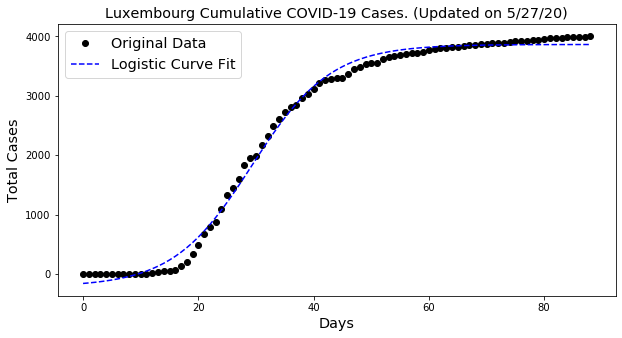



Hungary

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 3793.0
	Confirmed cases on 5/20/20 	 3598.0
	Ratio: 1.05
	Weekly increase: 5.4 %
	Daily increase: 0.8 % per day
	Doubling Time (represents recent growth): 91.9 days

** Based on Logistic Fit**

	R^2: 0.9986661244026913
	Doubling Time (during middle of growth):  15.19 (± 0.59 ) days


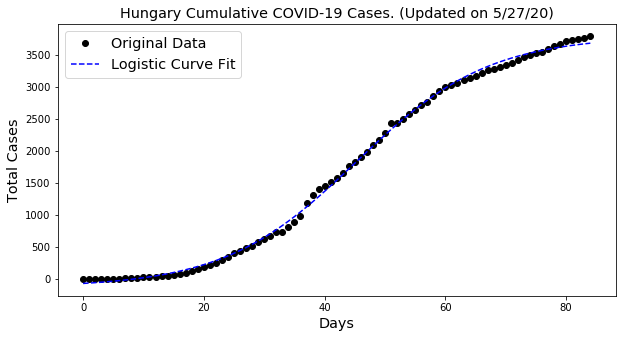



Tajikistan

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 3424.0
	Confirmed cases on 5/20/20 	 2140.0
	Ratio: 1.6
	Weekly increase: 60.0 %
	Daily increase: 6.9 % per day
	Doubling Time (represents recent growth): 10.3 days

** Based on Logistic Fit**

	R^2: 0.9965263242497762
	Doubling Time (during middle of growth):  7.99 (± 1.37 ) days


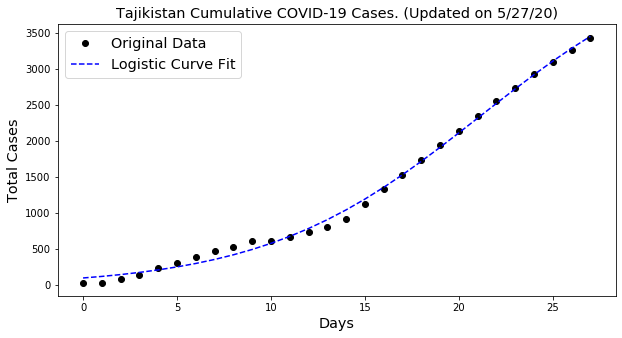



Uzbekistan

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 3369.0
	Confirmed cases on 5/20/20 	 2939.0
	Ratio: 1.15
	Weekly increase: 14.6 %
	Daily increase: 2.0 % per day
	Doubling Time (represents recent growth): 35.5 days

** Based on Logistic Fit**

	R^2: 0.9863280047822112
	Doubling Time (during middle of growth):  20.43 (± 3.76 ) days


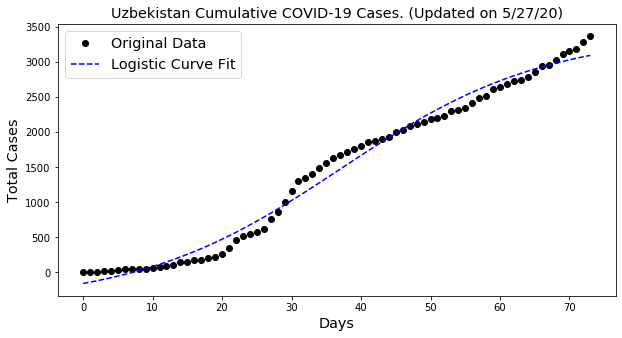



Guinea

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 3275.0
	Confirmed cases on 5/20/20 	 2863.0
	Ratio: 1.14
	Weekly increase: 14.4 %
	Daily increase: 1.9 % per day
	Doubling Time (represents recent growth): 36.1 days

** Based on Logistic Fit**

	R^2: 0.9978158097867806
	Doubling Time (during middle of growth):  15.69 (± 0.93 ) days


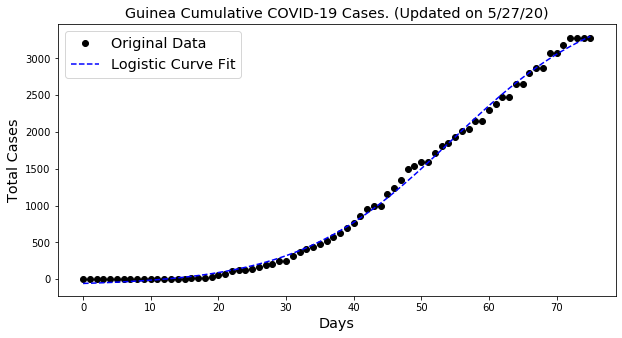



Senegal

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 3253.0
	Confirmed cases on 5/20/20 	 2714.0
	Ratio: 1.2
	Weekly increase: 19.9 %
	Daily increase: 2.6 % per day
	Doubling Time (represents recent growth): 26.8 days

** Based on Logistic Fit**

	R^2: 0.9981331946614685
	Doubling Time (during middle of growth):  14.49 (± 0.71 ) days

** Based on Exponential Fit **

	R^2: 0.9856377396776732
	Doubling Time (represents overall growth):  14.98 (± 1.02 ) days


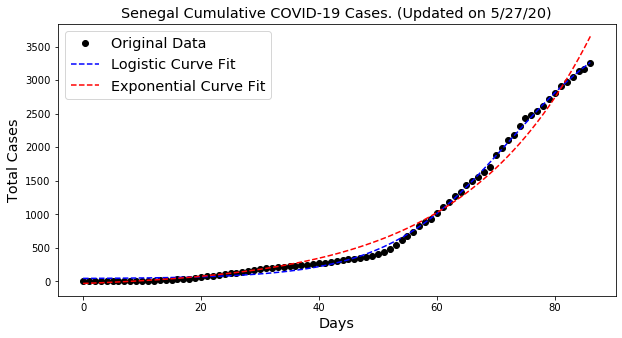



Thailand

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 3054.0
	Confirmed cases on 5/20/20 	 3034.0
	Ratio: 1.01
	Weekly increase: 0.7 %
	Daily increase: 0.1 % per day
	Doubling Time (represents recent growth): 738.5 days

** Based on Logistic Fit**

	R^2: 0.9981483196170102
	Doubling Time (during middle of growth):  8.52 (± 0.34 ) days


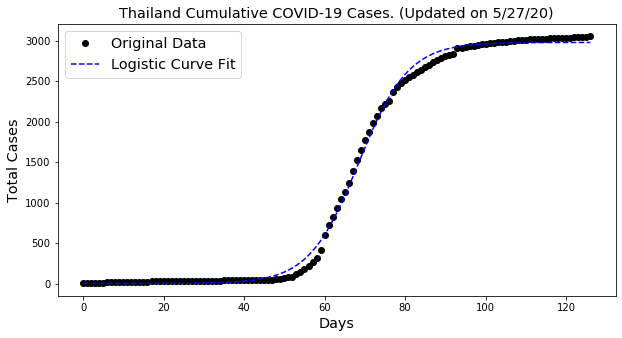



Greece

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 2903.0
	Confirmed cases on 5/20/20 	 2850.0
	Ratio: 1.02
	Weekly increase: 1.9 %
	Daily increase: 0.3 % per day
	Doubling Time (represents recent growth): 263.3 days

** Based on Logistic Fit**

	R^2: 0.9966146077241447
	Doubling Time (during middle of growth):  14.53 (± 0.83 ) days


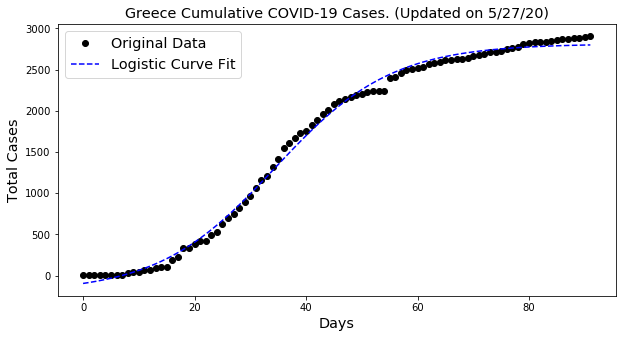



Djibouti

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 2697.0
	Confirmed cases on 5/20/20 	 1828.0
	Ratio: 1.48
	Weekly increase: 47.5 %
	Daily increase: 5.7 % per day
	Doubling Time (represents recent growth): 12.5 days


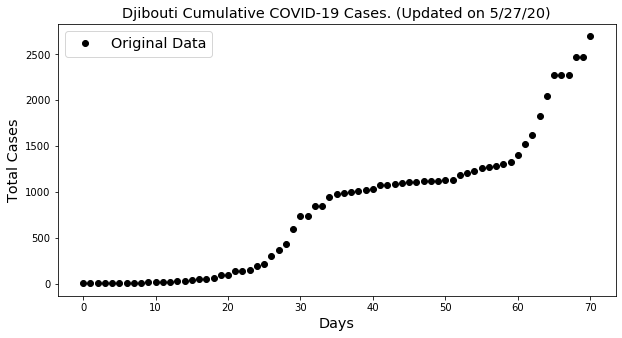



Cote d'Ivoire

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 2556.0
	Confirmed cases on 5/20/20 	 2231.0
	Ratio: 1.15
	Weekly increase: 14.6 %
	Daily increase: 2.0 % per day
	Doubling Time (represents recent growth): 35.7 days

** Based on Logistic Fit**

	R^2: 0.9978185276444238
	Doubling Time (during middle of growth):  25.89 (± 2.32 ) days


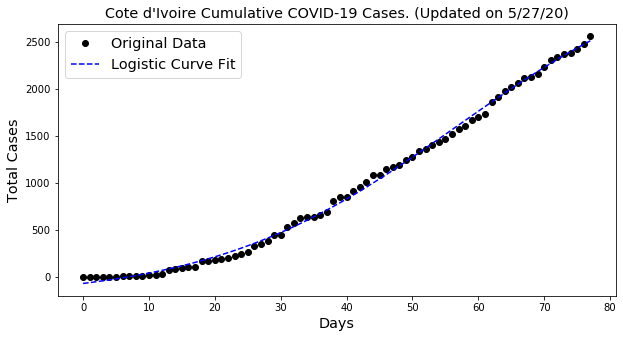



Congo (Kinshasa)

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 2546.0
	Confirmed cases on 5/20/20 	 1731.0
	Ratio: 1.47
	Weekly increase: 47.1 %
	Daily increase: 5.7 % per day
	Doubling Time (represents recent growth): 12.6 days

** Based on Logistic Fit**

	R^2: 0.9989070740428092
	Doubling Time (during middle of growth):  25.79 (± 0.5 ) days

** Based on Exponential Fit **

	R^2: 0.9989070740644386
	Doubling Time (represents overall growth):  12.9 (± 0.25 ) days


C:\Users\barba\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in sqrt


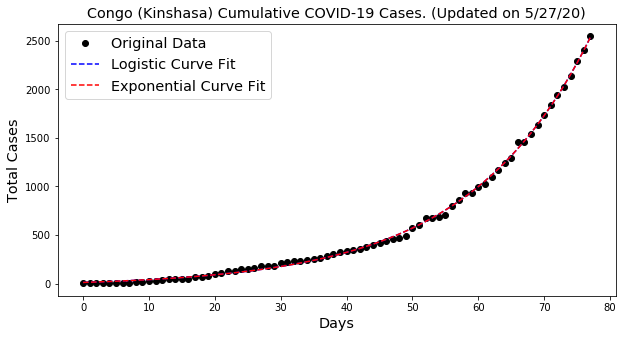



Bulgaria

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 2460.0
	Confirmed cases on 5/20/20 	 2292.0
	Ratio: 1.07
	Weekly increase: 7.3 %
	Daily increase: 1.0 % per day
	Doubling Time (represents recent growth): 68.6 days

** Based on Logistic Fit**

	R^2: 0.9978607565609011
	Doubling Time (during middle of growth):  23.22 (± 1.69 ) days


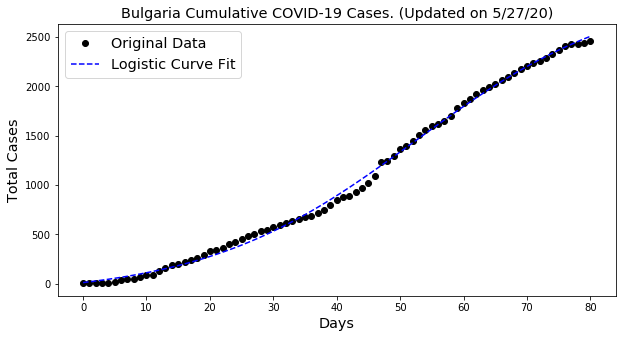



Bosnia and Herzegovina

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 2435.0
	Confirmed cases on 5/20/20 	 2338.0
	Ratio: 1.04
	Weekly increase: 4.1 %
	Daily increase: 0.6 % per day
	Doubling Time (represents recent growth): 119.4 days

** Based on Logistic Fit**

	R^2: 0.9974506045832133
	Doubling Time (during middle of growth):  20.33 (± 1.33 ) days


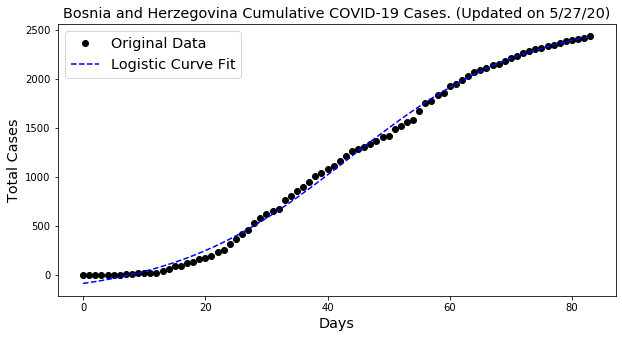



Gabon

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 2319.0
	Confirmed cases on 5/20/20 	 1567.0
	Ratio: 1.48
	Weekly increase: 48.0 %
	Daily increase: 5.8 % per day
	Doubling Time (represents recent growth): 12.4 days

** Based on Logistic Fit**

	R^2: 0.9967136511461703
	Doubling Time (during middle of growth):  12.03 (± 0.89 ) days

** Based on Exponential Fit **

	R^2: 0.9909243957060989
	Doubling Time (represents overall growth):  9.99 (± 0.52 ) days


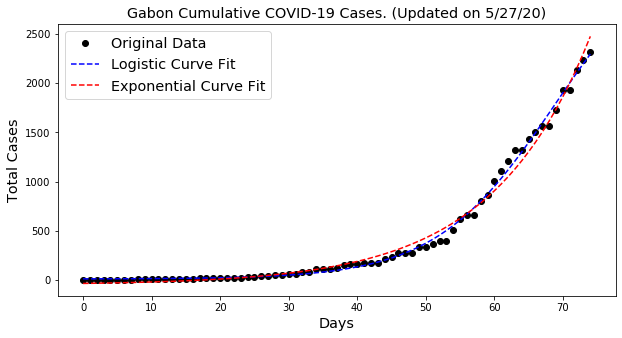



Croatia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 2244.0
	Confirmed cases on 5/20/20 	 2234.0
	Ratio: 1.0
	Weekly increase: 0.4 %
	Daily increase: 0.1 % per day
	Doubling Time (represents recent growth): 1086.4 days

** Based on Logistic Fit**

	R^2: 0.9976230902279707
	Doubling Time (during middle of growth):  11.25 (± 0.52 ) days


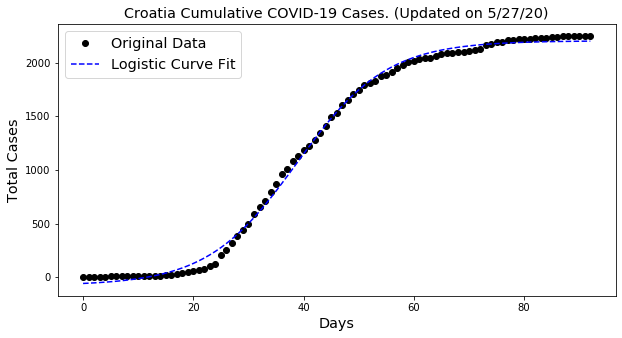



El Salvador

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 2109.0
	Confirmed cases on 5/20/20 	 1571.0
	Ratio: 1.34
	Weekly increase: 34.2 %
	Daily increase: 4.3 % per day
	Doubling Time (represents recent growth): 16.5 days

** Based on Logistic Fit**

	R^2: 0.9990349165461017
	Doubling Time (during middle of growth):  15.92 (± 0.77 ) days

** Based on Exponential Fit **

	R^2: 0.9957703581251653
	Doubling Time (represents overall growth):  12.74 (± 0.54 ) days


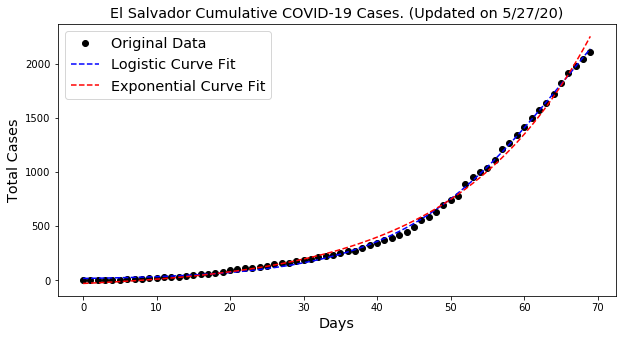



North Macedonia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 2039.0
	Confirmed cases on 5/20/20 	 1858.0
	Ratio: 1.1
	Weekly increase: 9.7 %
	Daily increase: 1.3 % per day
	Doubling Time (represents recent growth): 52.2 days

** Based on Logistic Fit**

	R^2: 0.9937532053657513
	Doubling Time (during middle of growth):  16.39 (± 1.32 ) days


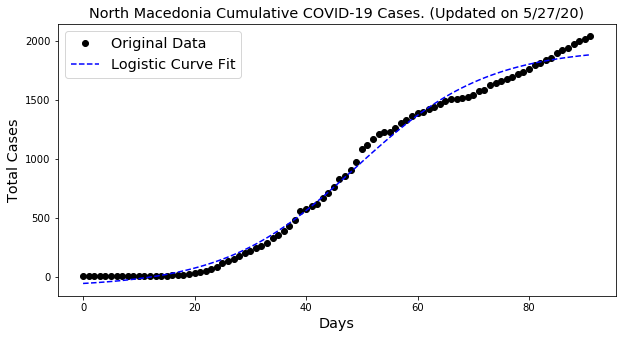



Cuba

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 1974.0
	Confirmed cases on 5/20/20 	 1900.0
	Ratio: 1.04
	Weekly increase: 3.9 %
	Daily increase: 0.5 % per day
	Doubling Time (represents recent growth): 127.0 days

** Based on Logistic Fit**

	R^2: 0.999374911309038
	Doubling Time (during middle of growth):  12.99 (± 0.35 ) days


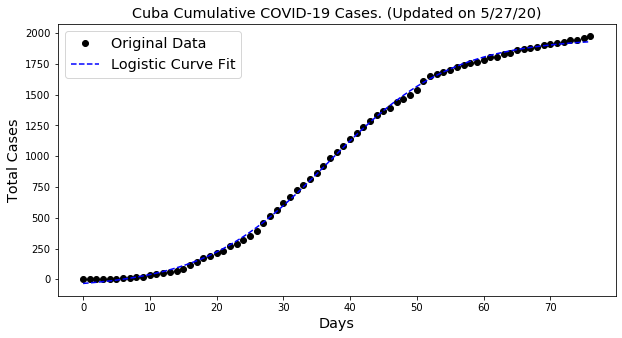



Estonia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 1840.0
	Confirmed cases on 5/20/20 	 1794.0
	Ratio: 1.03
	Weekly increase: 2.6 %
	Daily increase: 0.4 % per day
	Doubling Time (represents recent growth): 191.6 days

** Based on Logistic Fit**

	R^2: 0.9979535381245923
	Doubling Time (during middle of growth):  12.81 (± 0.56 ) days


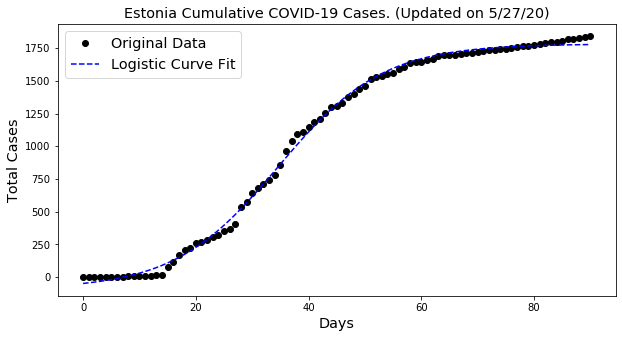



Iceland

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 1805.0
	Confirmed cases on 5/20/20 	 1803.0
	Ratio: 1.0
	Weekly increase: 0.1 %
	Daily increase: 0.0 % per day
	Doubling Time (represents recent growth): 4376.5 days

** Based on Logistic Fit**

	R^2: 0.9996055763441537
	Doubling Time (during middle of growth):  7.94 (± 0.16 ) days


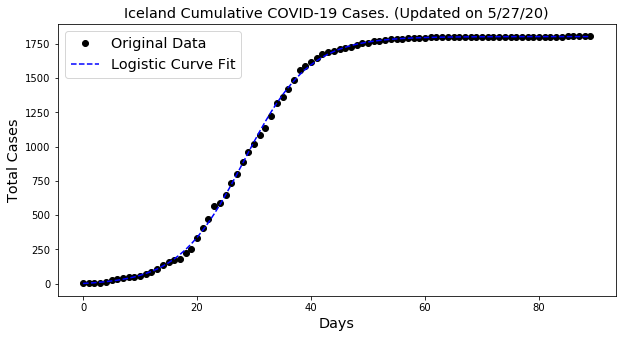



Somalia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 1731.0
	Confirmed cases on 5/20/20 	 1573.0
	Ratio: 1.1
	Weekly increase: 10.0 %
	Daily increase: 1.4 % per day
	Doubling Time (represents recent growth): 50.7 days

** Based on Logistic Fit**

	R^2: 0.9976946671751148
	Doubling Time (during middle of growth):  12.58 (± 0.72 ) days

** Based on Exponential Fit **

	R^2: 0.9637768535062398
	Doubling Time (represents overall growth):  15.61 (± 2.18 ) days


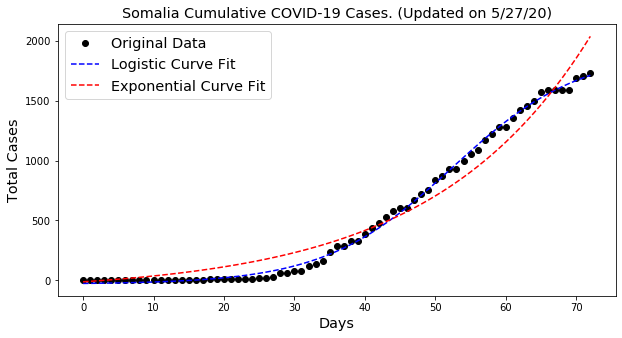



Lithuania

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 1647.0
	Confirmed cases on 5/20/20 	 1577.0
	Ratio: 1.04
	Weekly increase: 4.4 %
	Daily increase: 0.6 % per day
	Doubling Time (represents recent growth): 111.7 days

** Based on Logistic Fit**

	R^2: 0.993164473142101
	Doubling Time (during middle of growth):  11.9 (± 0.95 ) days


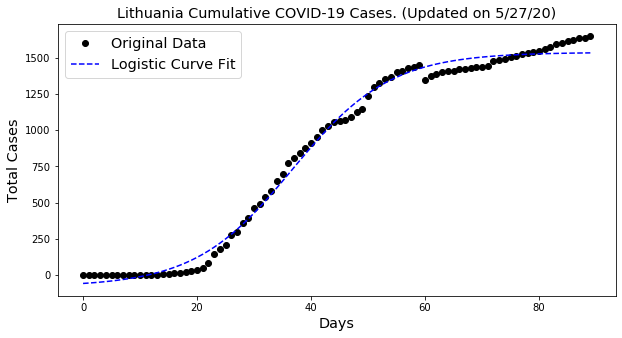



Kyrgyzstan

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 1520.0
	Confirmed cases on 5/20/20 	 1270.0
	Ratio: 1.2
	Weekly increase: 19.7 %
	Daily increase: 2.6 % per day
	Doubling Time (represents recent growth): 27.0 days

** Based on Logistic Fit**

	R^2: 0.9947542275271928
	Doubling Time (during middle of growth):  110.3 (± 228.43 ) days


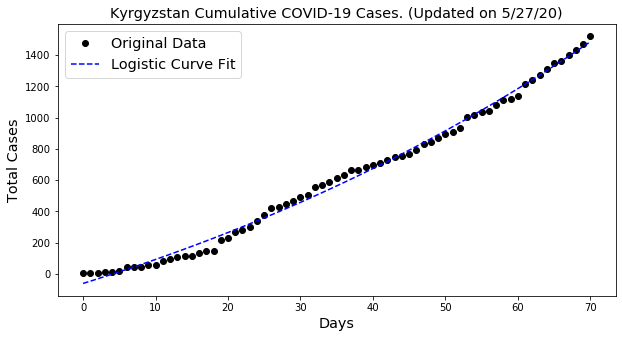



Slovakia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 1515.0
	Confirmed cases on 5/20/20 	 1496.0
	Ratio: 1.01
	Weekly increase: 1.3 %
	Daily increase: 0.2 % per day
	Doubling Time (represents recent growth): 384.5 days

** Based on Logistic Fit**

	R^2: 0.9962631397697761
	Doubling Time (during middle of growth):  11.57 (± 0.71 ) days


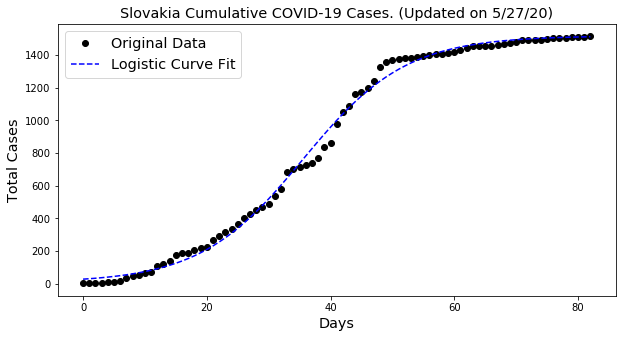



New Zealand

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 1504.0
	Confirmed cases on 5/20/20 	 1503.0
	Ratio: 1.0
	Weekly increase: 0.1 %
	Daily increase: 0.0 % per day
	Doubling Time (represents recent growth): 7295.0 days

** Based on Logistic Fit**

	R^2: 0.999054883047332
	Doubling Time (during middle of growth):  6.36 (± 0.21 ) days


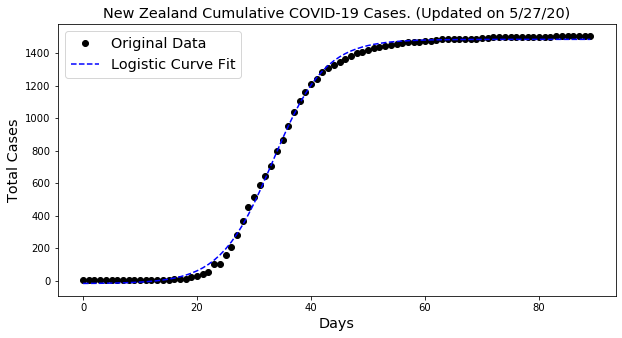



Slovenia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 1471.0
	Confirmed cases on 5/20/20 	 1468.0
	Ratio: 1.0
	Weekly increase: 0.2 %
	Daily increase: 0.0 % per day
	Doubling Time (represents recent growth): 2376.7 days

** Based on Logistic Fit**

	R^2: 0.9993575387043135
	Doubling Time (during middle of growth):  13.33 (± 0.36 ) days


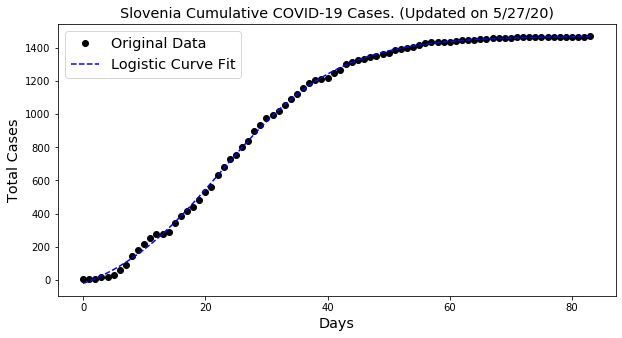



Kenya

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 1471.0
	Confirmed cases on 5/20/20 	 1029.0
	Ratio: 1.43
	Weekly increase: 43.0 %
	Daily increase: 5.2 % per day
	Doubling Time (represents recent growth): 13.6 days

** Based on Logistic Fit**

	R^2: 0.9956662988060981
	Doubling Time (during middle of growth):  34.19 (± 2.11 ) days

** Based on Exponential Fit **

	R^2: 0.995666298975462
	Doubling Time (represents overall growth):  17.1 (± 0.79 ) days


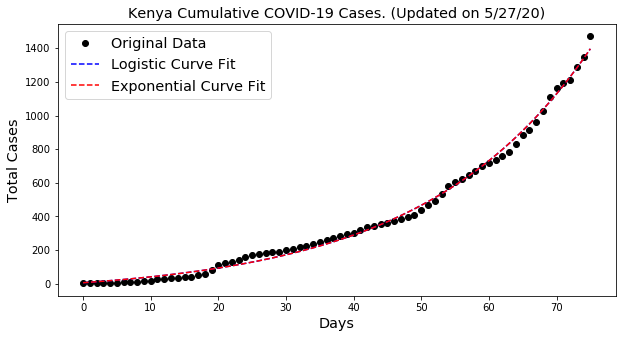



Sri Lanka

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 1469.0
	Confirmed cases on 5/20/20 	 1028.0
	Ratio: 1.43
	Weekly increase: 42.9 %
	Daily increase: 5.2 % per day
	Doubling Time (represents recent growth): 13.6 days

** Based on Logistic Fit**

	R^2: 0.9883791772765036
	Doubling Time (during middle of growth):  20.06 (± 2.05 ) days

** Based on Exponential Fit **

	R^2: 0.9768806042335032
	Doubling Time (represents overall growth):  21.97 (± 1.63 ) days


C:\Users\barba\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  


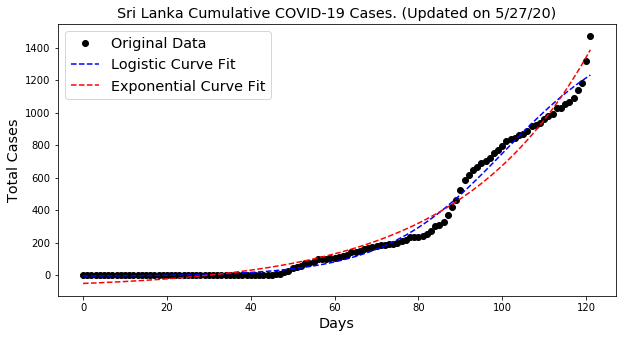



Maldives

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 1457.0
	Confirmed cases on 5/20/20 	 1186.0
	Ratio: 1.23
	Weekly increase: 22.8 %
	Daily increase: 3.0 % per day
	Doubling Time (represents recent growth): 23.6 days

** Based on Logistic Fit**

	R^2: 0.9946360679007612
	Doubling Time (during middle of growth):  10.21 (± 0.8 ) days

** Based on Exponential Fit **

	R^2: 0.9640576947171862
	Doubling Time (represents overall growth):  14.66 (± 1.7 ) days


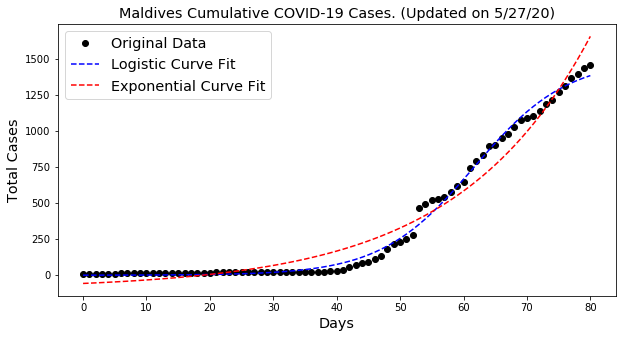



Haiti

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 1320.0
	Confirmed cases on 5/20/20 	 596.0
	Ratio: 2.21
	Weekly increase: 121.5 %
	Daily increase: 12.0 % per day
	Doubling Time (represents recent growth): 6.1 days

** Based on Exponential Fit **

	R^2: 0.992890249361703
	Doubling Time (represents overall growth):  5.97 (± 0.26 ) days


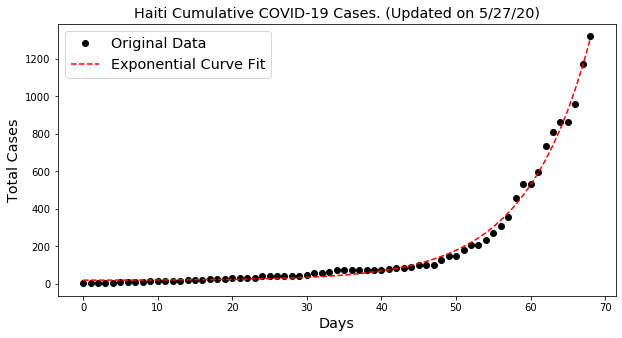



Venezuela

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 1245.0
	Confirmed cases on 5/20/20 	 824.0
	Ratio: 1.51
	Weekly increase: 51.1 %
	Daily increase: 6.1 % per day
	Doubling Time (represents recent growth): 11.8 days

** Based on Logistic Fit**

	R^2: 0.956136511987081
	Doubling Time (during middle of growth):  19.8 (± 3.33 ) days

** Based on Exponential Fit **

	R^2: 0.9559400374688063
	Doubling Time (represents overall growth):  10.22 (± 1.19 ) days


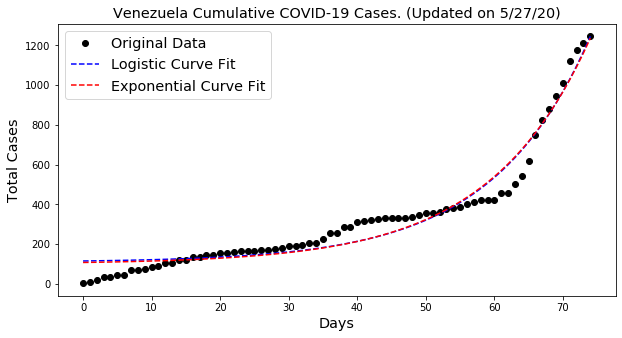



Guinea-Bissau

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 1195.0
	Confirmed cases on 5/20/20 	 1089.0
	Ratio: 1.1
	Weekly increase: 9.7 %
	Daily increase: 1.3 % per day
	Doubling Time (represents recent growth): 52.2 days

** Based on Logistic Fit**

	R^2: 0.9971161021066973
	Doubling Time (during middle of growth):  6.77 (± 0.42 ) days


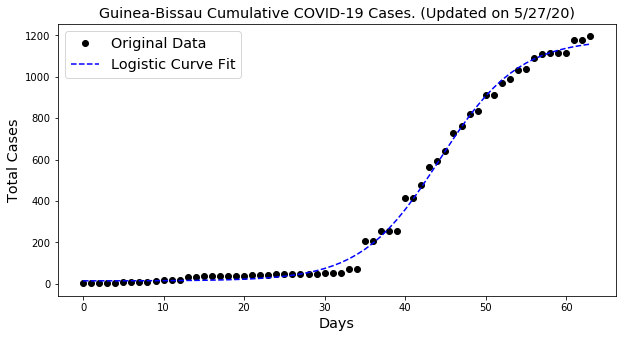



Lebanon

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 1161.0
	Confirmed cases on 5/20/20 	 961.0
	Ratio: 1.21
	Weekly increase: 20.8 %
	Daily increase: 2.7 % per day
	Doubling Time (represents recent growth): 25.7 days

** Based on Logistic Fit**

	R^2: 0.9697285391707963
	Doubling Time (during middle of growth):  52.69 (± 32.11 ) days


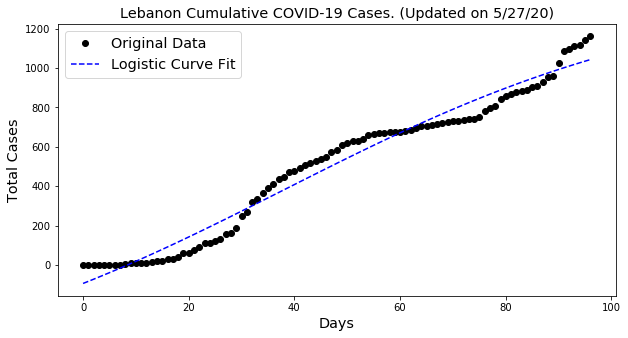



Mali

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 1116.0
	Confirmed cases on 5/20/20 	 931.0
	Ratio: 1.2
	Weekly increase: 19.9 %
	Daily increase: 2.6 % per day
	Doubling Time (represents recent growth): 26.8 days

** Based on Logistic Fit**

	R^2: 0.9968756466643302
	Doubling Time (during middle of growth):  19.71 (± 2.14 ) days

** Based on Exponential Fit **

	R^2: 0.9581324500235054
	Doubling Time (represents overall growth):  17.01 (± 3.13 ) days


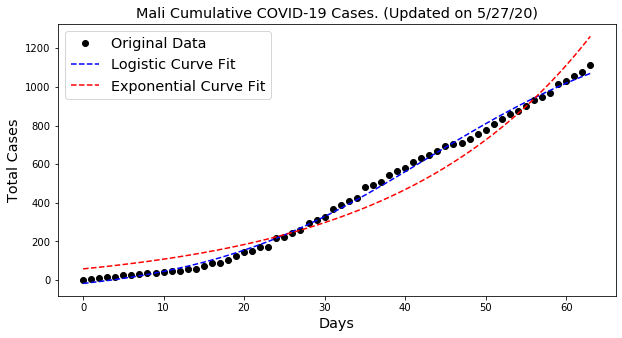



Zambia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 1057.0
	Confirmed cases on 5/20/20 	 832.0
	Ratio: 1.27
	Weekly increase: 27.0 %
	Daily increase: 3.5 % per day
	Doubling Time (represents recent growth): 20.3 days

** Based on Logistic Fit**

	R^2: 0.9892750483538523
	Doubling Time (during middle of growth):  5.14 (± 0.61 ) days


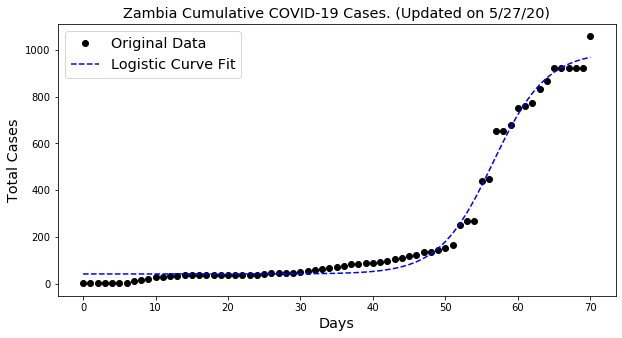



Latvia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 1057.0
	Confirmed cases on 5/20/20 	 1016.0
	Ratio: 1.04
	Weekly increase: 4.0 %
	Daily increase: 0.6 % per day
	Doubling Time (represents recent growth): 122.6 days

** Based on Logistic Fit**

	R^2: 0.9922918374128484
	Doubling Time (during middle of growth):  20.32 (± 2.24 ) days


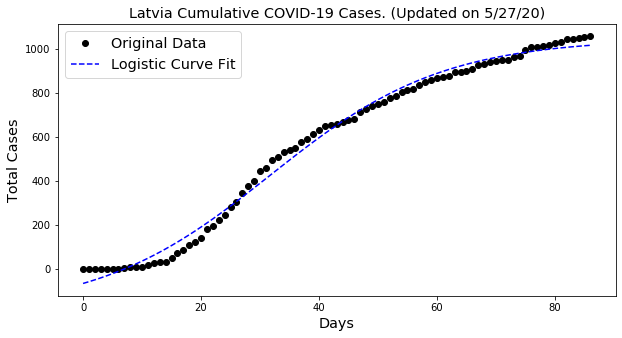



Tunisia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 1051.0
	Confirmed cases on 5/20/20 	 1045.0
	Ratio: 1.01
	Weekly increase: 0.6 %
	Daily increase: 0.1 % per day
	Doubling Time (represents recent growth): 847.5 days

** Based on Logistic Fit**

	R^2: 0.9965623256719125
	Doubling Time (during middle of growth):  11.48 (± 0.67 ) days


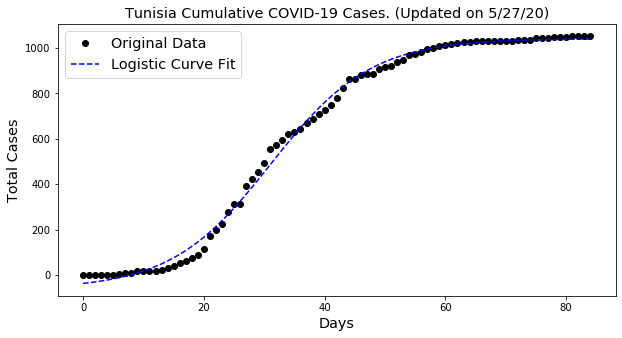



Albania

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 1050.0
	Confirmed cases on 5/20/20 	 964.0
	Ratio: 1.09
	Weekly increase: 8.9 %
	Daily increase: 1.2 % per day
	Doubling Time (represents recent growth): 56.8 days

** Based on Logistic Fit**

	R^2: 0.9978653275769167
	Doubling Time (during middle of growth):  23.94 (± 1.82 ) days


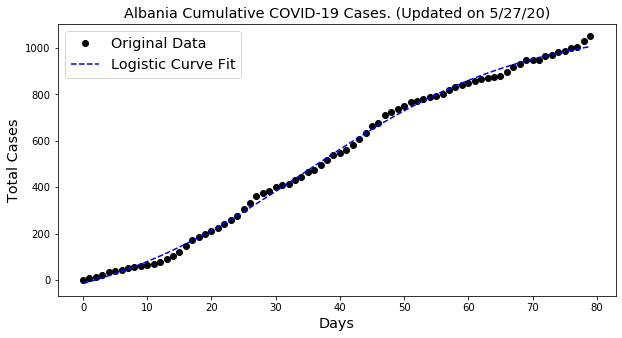



Kosovo

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 1047.0
	Confirmed cases on 5/20/20 	 989.0
	Ratio: 1.06
	Weekly increase: 5.9 %
	Daily increase: 0.8 % per day
	Doubling Time (represents recent growth): 85.1 days

** Based on Logistic Fit**

	R^2: 0.9910820999693735
	Doubling Time (during middle of growth):  11.02 (± 1.3 ) days


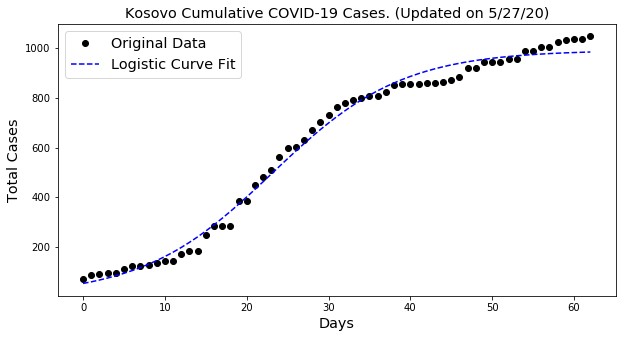



Equatorial Guinea

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 1043.0
	Confirmed cases on 5/20/20 	 890.0
	Ratio: 1.17
	Weekly increase: 17.2 %
	Daily increase: 2.3 % per day
	Doubling Time (represents recent growth): 30.6 days

** Based on Logistic Fit**

	R^2: 0.9829984362797732
	Doubling Time (during middle of growth):  19.92 (± 4.59 ) days

** Based on Exponential Fit **

	R^2: 0.9810511592384634
	Doubling Time (represents overall growth):  14.18 (± 1.27 ) days


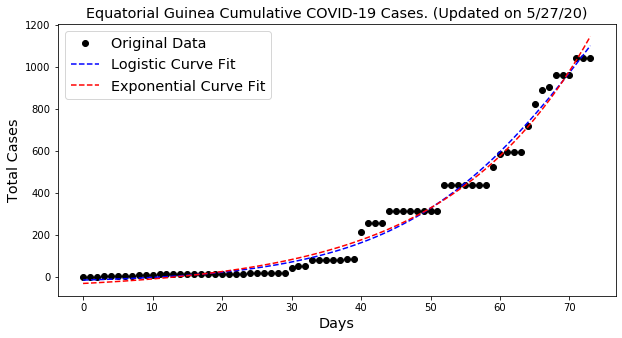



South Sudan

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 994.0
	Confirmed cases on 5/20/20 	 290.0
	Ratio: 3.43
	Weekly increase: 242.8 %
	Daily increase: 19.2 % per day
	Doubling Time (represents recent growth): 3.9 days

** Based on Logistic Fit**

	R^2: 0.9876244937625898
	Doubling Time (during middle of growth):  11.13 (± nan ) days

** Based on Exponential Fit **


C:\Users\barba\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in sqrt



	R^2: 0.9876244940282226
	Doubling Time (represents overall growth):  5.57 (± 0.38 ) days


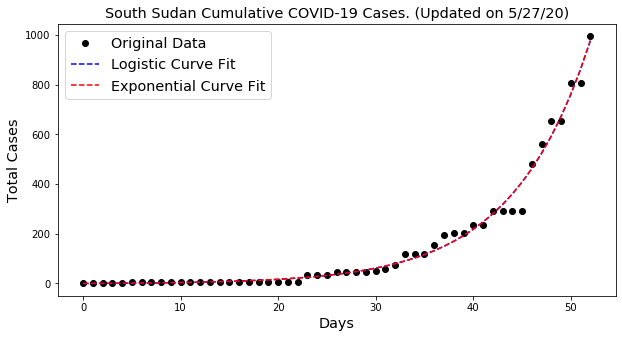



Costa Rica

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 984.0
	Confirmed cases on 5/20/20 	 897.0
	Ratio: 1.1
	Weekly increase: 9.7 %
	Daily increase: 1.3 % per day
	Doubling Time (represents recent growth): 52.4 days

** Based on Logistic Fit**

	R^2: 0.986082848838284
	Doubling Time (during middle of growth):  24.05 (± 4.55 ) days


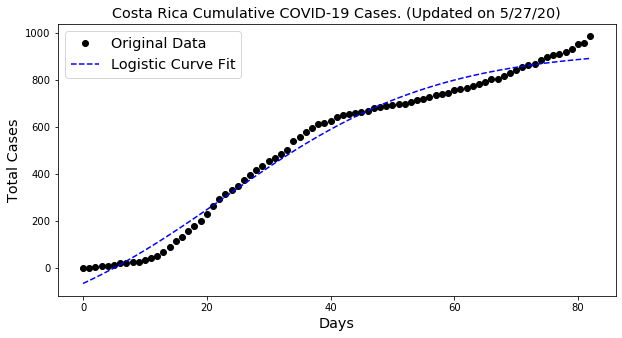



Niger

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 952.0
	Confirmed cases on 5/20/20 	 920.0
	Ratio: 1.03
	Weekly increase: 3.5 %
	Daily increase: 0.5 % per day
	Doubling Time (represents recent growth): 141.9 days

** Based on Logistic Fit**

	R^2: 0.9764617386580573
	Doubling Time (during middle of growth):  14.64 (± 3.08 ) days


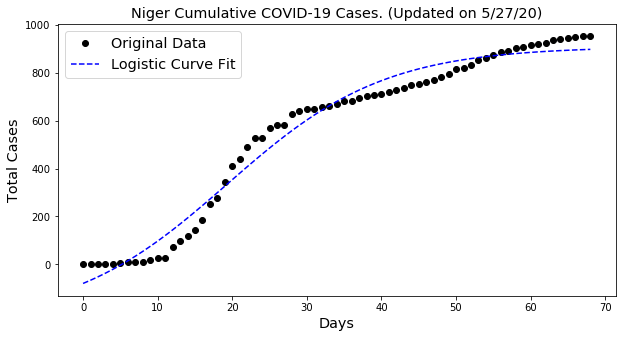



Cyprus

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 939.0
	Confirmed cases on 5/20/20 	 922.0
	Ratio: 1.02
	Weekly increase: 1.8 %
	Daily increase: 0.3 % per day
	Doubling Time (represents recent growth): 265.6 days

** Based on Logistic Fit**

	R^2: 0.9977952053837873
	Doubling Time (during middle of growth):  11.08 (± 0.54 ) days


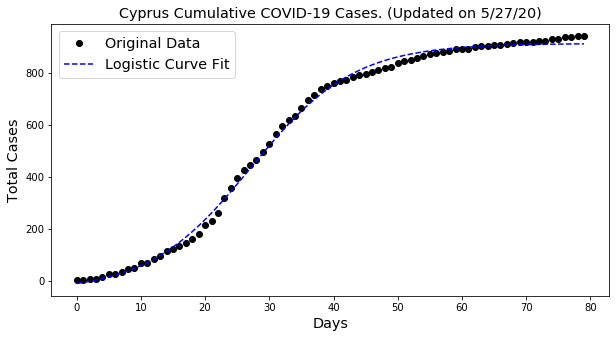



Nepal

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 886.0
	Confirmed cases on 5/20/20 	 427.0
	Ratio: 2.07
	Weekly increase: 107.5 %
	Daily increase: 11.0 % per day
	Doubling Time (represents recent growth): 6.6 days

** Based on Exponential Fit **

	R^2: 0.9956043154888878
	Doubling Time (represents overall growth):  6.82 (± 0.16 ) days


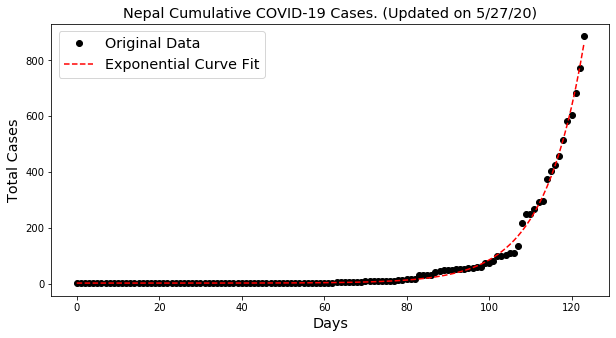



Paraguay

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 884.0
	Confirmed cases on 5/20/20 	 833.0
	Ratio: 1.06
	Weekly increase: 6.1 %
	Daily increase: 0.9 % per day
	Doubling Time (represents recent growth): 81.7 days

** Based on Logistic Fit**

	R^2: 0.9810403375458723
	Doubling Time (during middle of growth):  12.76 (± 1.95 ) days

** Based on Exponential Fit **

	R^2: 0.9614122224610911
	Doubling Time (represents overall growth):  20.85 (± 3.14 ) days


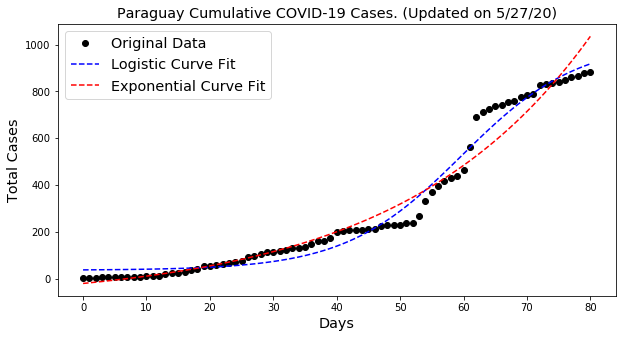



Burkina Faso

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 845.0
	Confirmed cases on 5/20/20 	 809.0
	Ratio: 1.04
	Weekly increase: 4.4 %
	Daily increase: 0.6 % per day
	Doubling Time (represents recent growth): 111.4 days

** Based on Logistic Fit**

	R^2: 0.9938053459164271
	Doubling Time (during middle of growth):  21.87 (± 2.68 ) days


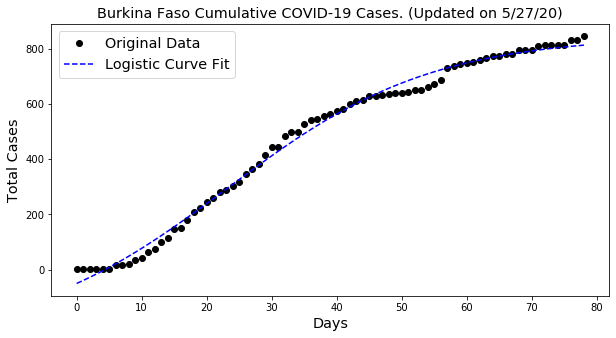



Uruguay

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 803.0
	Confirmed cases on 5/20/20 	 746.0
	Ratio: 1.08
	Weekly increase: 7.6 %
	Daily increase: 1.1 % per day
	Doubling Time (represents recent growth): 65.9 days

** Based on Logistic Fit**

	R^2: 0.9952617825714868
	Doubling Time (during middle of growth):  54.18 (± 10.74 ) days


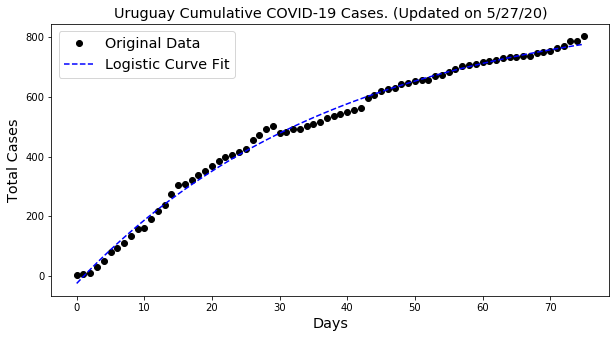



Sierra Leone

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 782.0
	Confirmed cases on 5/20/20 	 570.0
	Ratio: 1.37
	Weekly increase: 37.2 %
	Daily increase: 4.6 % per day
	Doubling Time (represents recent growth): 15.3 days

** Based on Logistic Fit**

	R^2: 0.9981847591538012
	Doubling Time (during middle of growth):  13.99 (± 1.03 ) days

** Based on Exponential Fit **

	R^2: 0.9930516860974969
	Doubling Time (represents overall growth):  13.26 (± 0.91 ) days


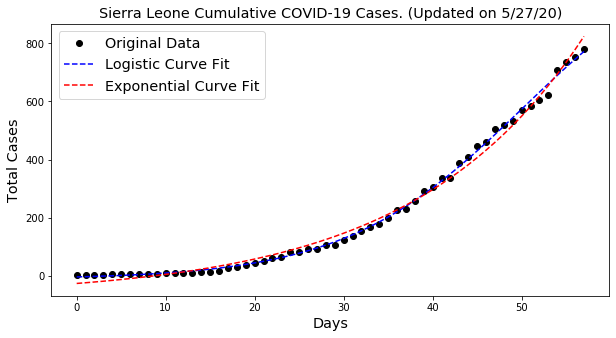



Andorra

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 763.0
	Confirmed cases on 5/20/20 	 762.0
	Ratio: 1.0
	Weekly increase: 0.1 %
	Daily increase: 0.0 % per day
	Doubling Time (represents recent growth): 3699.7 days

** Based on Logistic Fit**

	R^2: 0.9980410114883219
	Doubling Time (during middle of growth):  9.26 (± 0.4 ) days


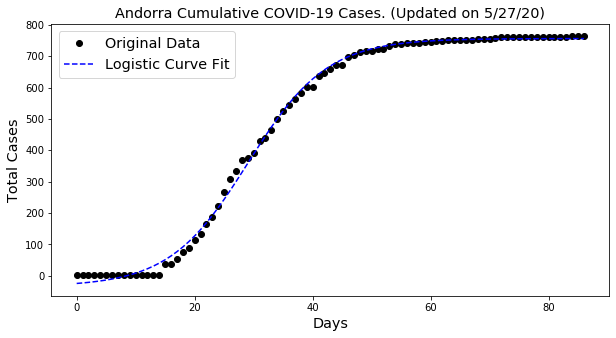



Nicaragua

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 759.0
	Confirmed cases on 5/20/20 	 254.0
	Ratio: 2.99
	Weekly increase: 198.8 %
	Daily increase: 16.9 % per day
	Doubling Time (represents recent growth): 4.4 days


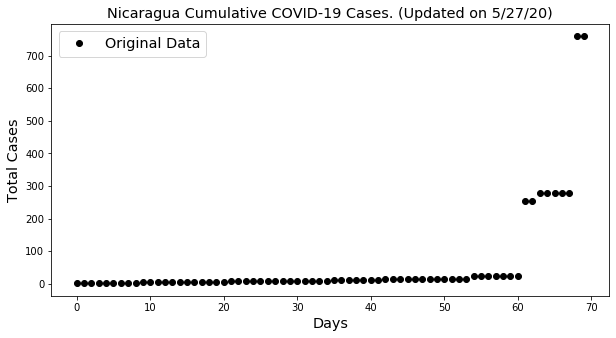



Georgia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 735.0
	Confirmed cases on 5/20/20 	 713.0
	Ratio: 1.03
	Weekly increase: 3.1 %
	Daily increase: 0.4 % per day
	Doubling Time (represents recent growth): 159.7 days

** Based on Logistic Fit**

	R^2: 0.9989233583054696
	Doubling Time (during middle of growth):  16.7 (± 0.56 ) days


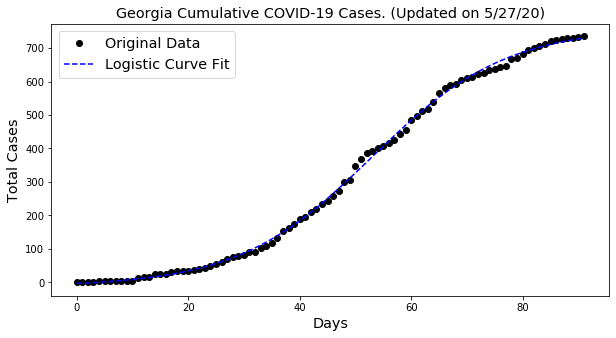



Ethiopia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 731.0
	Confirmed cases on 5/20/20 	 389.0
	Ratio: 1.88
	Weekly increase: 87.9 %
	Daily increase: 9.4 % per day
	Doubling Time (represents recent growth): 7.7 days

** Based on Logistic Fit**

	R^2: 0.9774497796985847
	Doubling Time (during middle of growth):  19.48 (± 1.71 ) days

** Based on Exponential Fit **

	R^2: 0.9774497806120503
	Doubling Time (represents overall growth):  9.74 (± 0.79 ) days


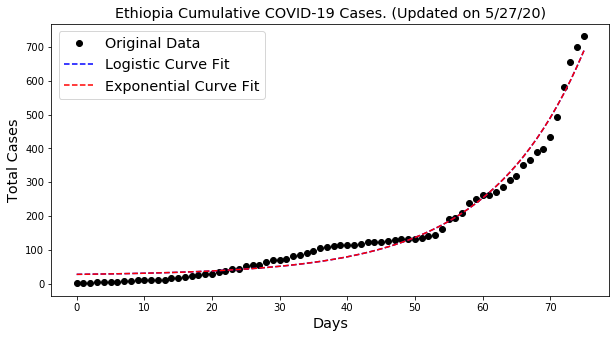



Jordan

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 720.0
	Confirmed cases on 5/20/20 	 672.0
	Ratio: 1.07
	Weekly increase: 7.1 %
	Daily increase: 1.0 % per day
	Doubling Time (represents recent growth): 70.3 days

** Based on Logistic Fit**

	R^2: 0.9694081594449019
	Doubling Time (during middle of growth):  185.6 (± 802.99 ) days


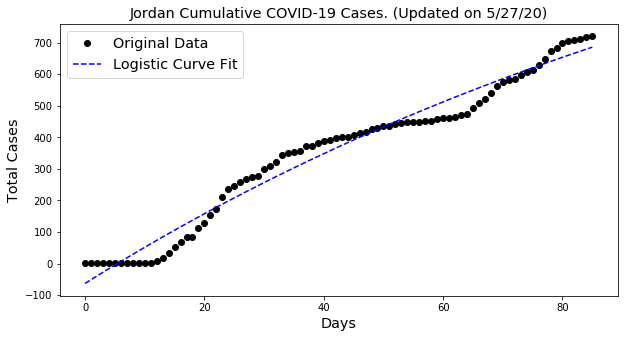



Chad

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 715.0
	Confirmed cases on 5/20/20 	 565.0
	Ratio: 1.27
	Weekly increase: 26.5 %
	Daily increase: 3.4 % per day
	Doubling Time (represents recent growth): 20.6 days

** Based on Logistic Fit**

	R^2: 0.9962806212931063
	Doubling Time (during middle of growth):  8.86 (± 0.63 ) days

** Based on Exponential Fit **

	R^2: 0.9724020748896974
	Doubling Time (represents overall growth):  11.73 (± 1.22 ) days


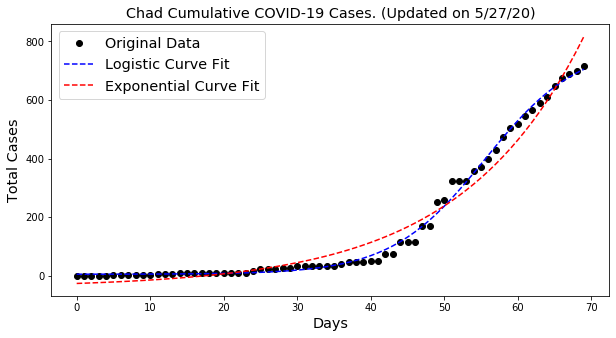



Diamond Princess

** Based on Logistic Fit**

	R^2: 0.996585905080971
	Doubling Time (during middle of growth):  2.85 (± 0.17 ) days


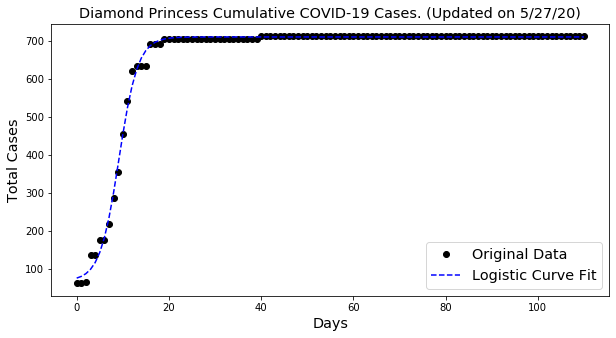



Central African Republic

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 702.0
	Confirmed cases on 5/20/20 	 418.0
	Ratio: 1.68
	Weekly increase: 67.9 %
	Daily increase: 7.7 % per day
	Doubling Time (represents recent growth): 9.4 days

** Based on Exponential Fit **

	R^2: 0.9877937021872437
	Doubling Time (represents overall growth):  7.37 (± 0.41 ) days


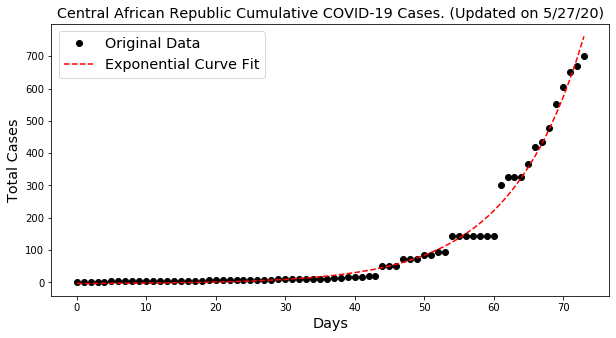



San Marino

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 667.0
	Confirmed cases on 5/20/20 	 656.0
	Ratio: 1.02
	Weekly increase: 1.7 %
	Daily increase: 0.2 % per day
	Doubling Time (represents recent growth): 291.8 days

** Based on Logistic Fit**

	R^2: 0.9954281308572174
	Doubling Time (during middle of growth):  23.18 (± 2.04 ) days


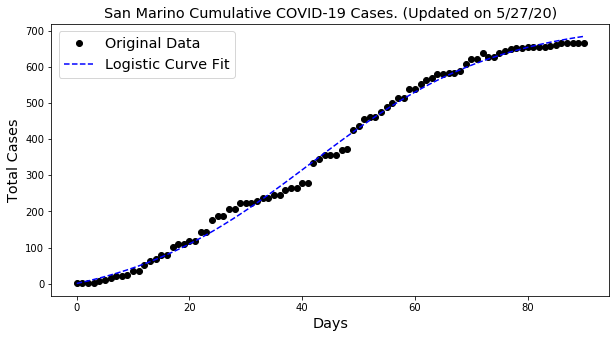



Malta

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 612.0
	Confirmed cases on 5/20/20 	 584.0
	Ratio: 1.05
	Weekly increase: 4.8 %
	Daily increase: 0.7 % per day
	Doubling Time (represents recent growth): 103.6 days

** Based on Logistic Fit**

	R^2: 0.9836599178387051
	Doubling Time (during middle of growth):  20.72 (± 3.71 ) days


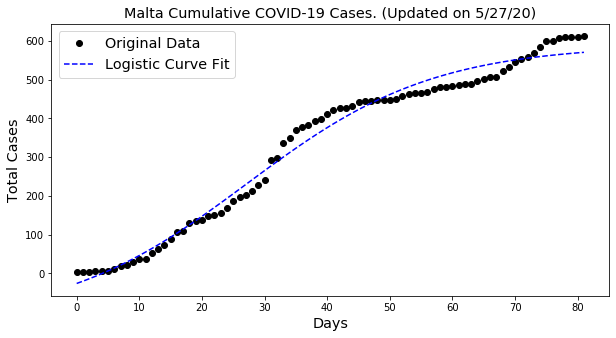



Madagascar

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 612.0
	Confirmed cases on 5/20/20 	 371.0
	Ratio: 1.65
	Weekly increase: 65.0 %
	Daily increase: 7.4 % per day
	Doubling Time (represents recent growth): 9.7 days

** Based on Logistic Fit**

	R^2: 0.9659043644537549
	Doubling Time (during middle of growth):  17.94 (± nan ) days

** Based on Exponential Fit **

	R^2: 0.9659043657192294
	Doubling Time (represents overall growth):  8.97 (± 0.95 ) days


C:\Users\barba\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in sqrt


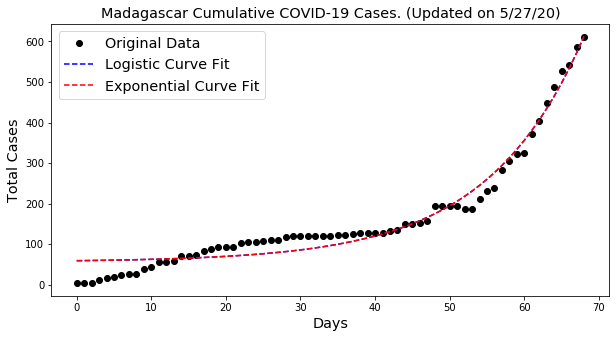



Congo (Brazzaville)

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 571.0
	Confirmed cases on 5/20/20 	 420.0
	Ratio: 1.36
	Weekly increase: 36.0 %
	Daily increase: 4.5 % per day
	Doubling Time (represents recent growth): 15.8 days

** Based on Logistic Fit**

	R^2: 0.9872501178674908
	Doubling Time (during middle of growth):  36.81 (± 15.05 ) days

** Based on Exponential Fit **

	R^2: 0.9859277995800162
	Doubling Time (represents overall growth):  25.02 (± 2.91 ) days


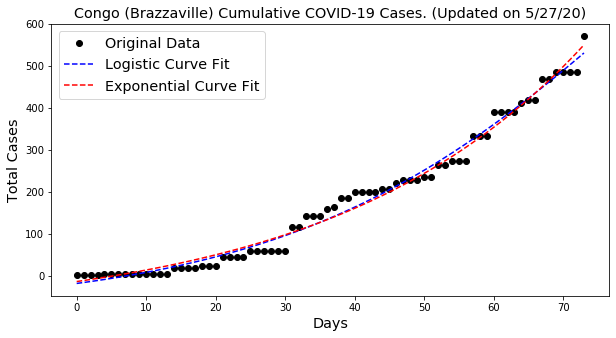



Jamaica

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 569.0
	Confirmed cases on 5/20/20 	 529.0
	Ratio: 1.08
	Weekly increase: 7.6 %
	Daily increase: 1.0 % per day
	Doubling Time (represents recent growth): 66.6 days

** Based on Logistic Fit**

	R^2: 0.9967798532747938
	Doubling Time (during middle of growth):  8.21 (± 0.48 ) days


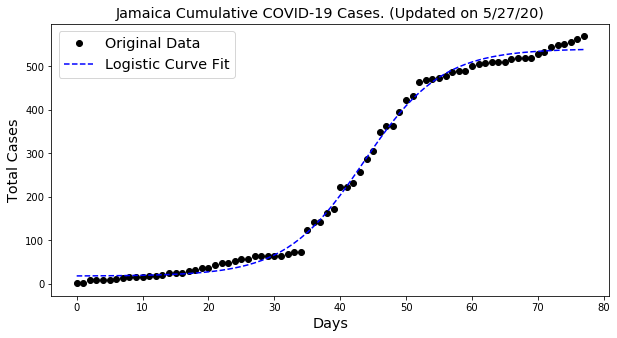



Tanzania

** Based on Logistic Fit**

	R^2: 0.9893730584069204
	Doubling Time (during middle of growth):  6.45 (± 0.75 ) days


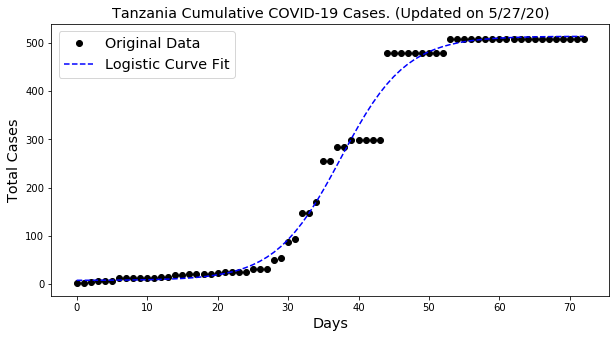



Sao Tome and Principe

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 443.0
	Confirmed cases on 5/20/20 	 251.0
	Ratio: 1.76
	Weekly increase: 76.5 %
	Daily increase: 8.5 % per day
	Doubling Time (represents recent growth): 8.5 days


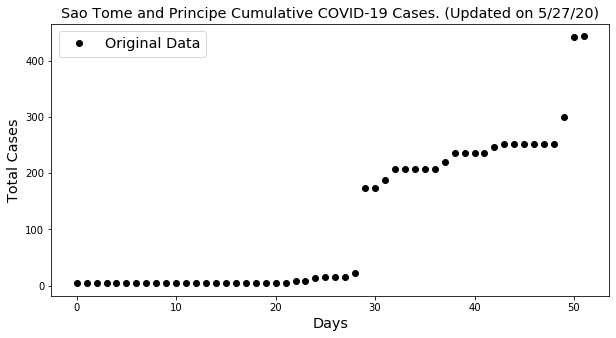



Taiwan*

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 441.0
	Confirmed cases on 5/20/20 	 440.0
	Ratio: 1.0
	Weekly increase: 0.2 %
	Daily increase: 0.0 % per day
	Doubling Time (represents recent growth): 2137.3 days

** Based on Logistic Fit**

	R^2: 0.9965154084437174
	Doubling Time (during middle of growth):  8.84 (± 0.47 ) days


C:\Users\barba\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  


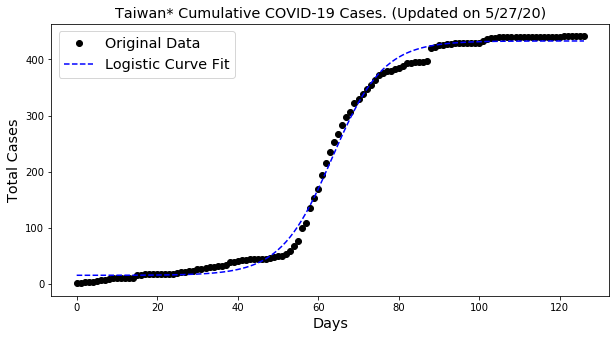



West Bank and Gaza

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 434.0
	Confirmed cases on 5/20/20 	 398.0
	Ratio: 1.09
	Weekly increase: 9.0 %
	Daily increase: 1.2 % per day
	Doubling Time (represents recent growth): 56.0 days

** Based on Logistic Fit**

	R^2: 0.9843499137572557
	Doubling Time (during middle of growth):  13.08 (± 1.7 ) days


C:\Users\barba\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  


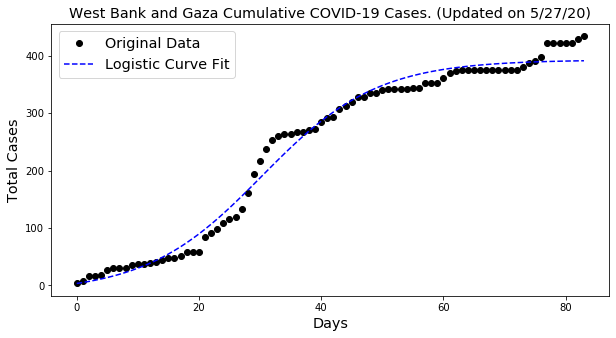



Togo

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 395.0
	Confirmed cases on 5/20/20 	 340.0
	Ratio: 1.16
	Weekly increase: 16.2 %
	Daily increase: 2.2 % per day
	Doubling Time (represents recent growth): 32.4 days

** Based on Logistic Fit**

	R^2: 0.975473275522054
	Doubling Time (during middle of growth):  30.31 (± 10.8 ) days

** Based on Exponential Fit **

	R^2: 0.9754732764781973
	Doubling Time (represents overall growth):  15.15 (± 1.42 ) days


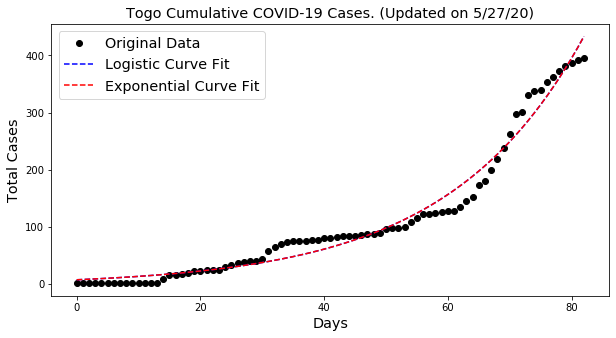



Cabo Verde

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 390.0
	Confirmed cases on 5/20/20 	 349.0
	Ratio: 1.12
	Weekly increase: 11.7 %
	Daily increase: 1.6 % per day
	Doubling Time (represents recent growth): 43.7 days

** Based on Logistic Fit**

	R^2: 0.9956490284618004
	Doubling Time (during middle of growth):  12.81 (± 1.06 ) days

** Based on Exponential Fit **

	R^2: 0.9752763000092408
	Doubling Time (represents overall growth):  22.32 (± 3.43 ) days


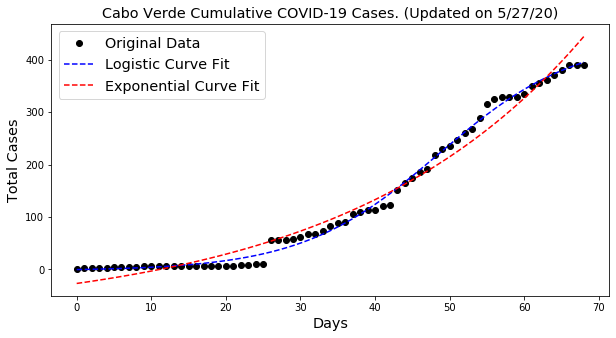



Rwanda

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 346.0
	Confirmed cases on 5/20/20 	 314.0
	Ratio: 1.1
	Weekly increase: 10.2 %
	Daily increase: 1.4 % per day
	Doubling Time (represents recent growth): 50.0 days

** Based on Logistic Fit**

	R^2: 0.9892663152307783
	Doubling Time (during middle of growth):  33.16 (± 9.83 ) days


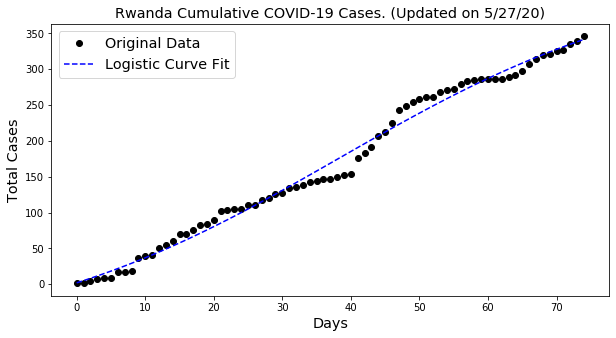



Mauritius

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 334.0
	Confirmed cases on 5/20/20 	 332.0
	Ratio: 1.01
	Weekly increase: 0.6 %
	Daily increase: 0.1 % per day
	Doubling Time (represents recent growth): 807.9 days

** Based on Logistic Fit**

	R^2: 0.9951680069956521
	Doubling Time (during middle of growth):  5.91 (± 0.47 ) days


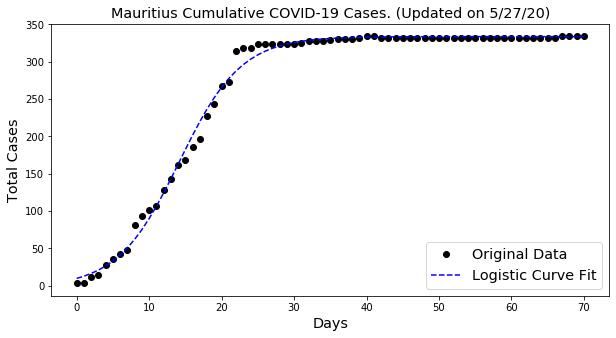



Vietnam

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 327.0
	Confirmed cases on 5/20/20 	 324.0
	Ratio: 1.01
	Weekly increase: 0.9 %
	Daily increase: 0.1 % per day
	Doubling Time (represents recent growth): 526.4 days

** Based on Logistic Fit**

	R^2: 0.9885367693289111
	Doubling Time (during middle of growth):  10.13 (± 0.94 ) days


C:\Users\barba\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in exp
  


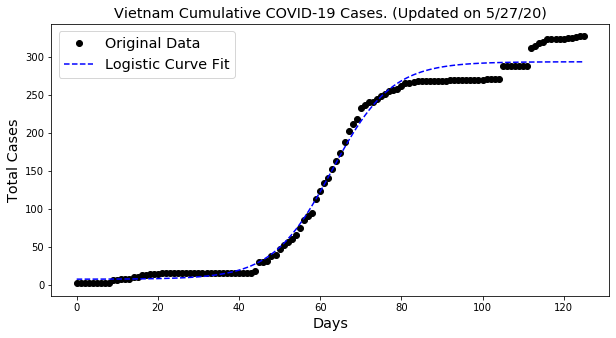



Montenegro

** Based on Logistic Fit**

	R^2: 0.9968114461278614
	Doubling Time (during middle of growth):  7.49 (± 0.47 ) days


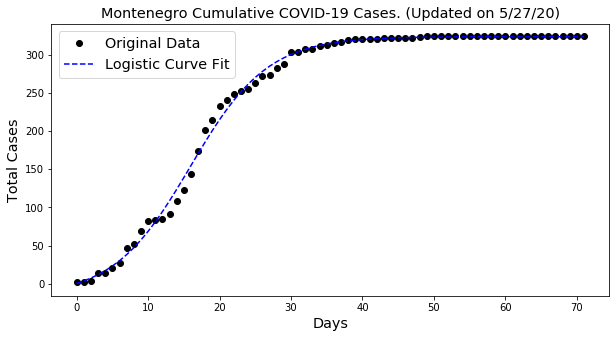



Mauritania

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 292.0
	Confirmed cases on 5/20/20 	 141.0
	Ratio: 2.07
	Weekly increase: 107.1 %
	Daily increase: 11.0 % per day
	Doubling Time (represents recent growth): 6.7 days

** Based on Exponential Fit **

	R^2: 0.9589092765640035
	Doubling Time (represents overall growth):  4.66 (± 0.46 ) days


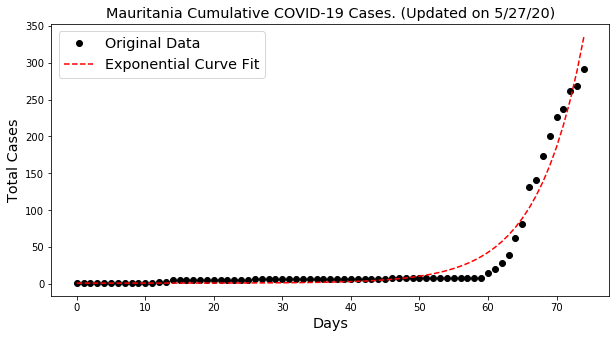



Uganda

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 281.0
	Confirmed cases on 5/20/20 	 264.0
	Ratio: 1.06
	Weekly increase: 6.4 %
	Daily increase: 0.9 % per day
	Doubling Time (represents recent growth): 77.7 days


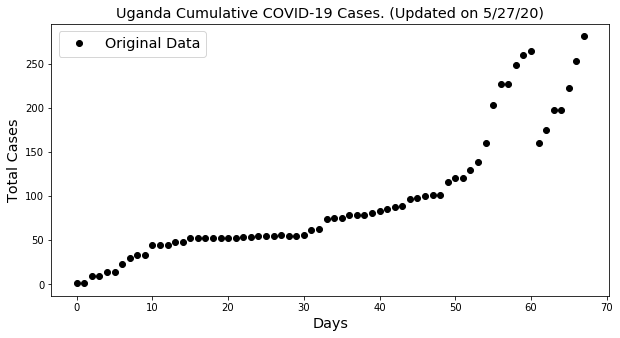



Eswatini

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 272.0
	Confirmed cases on 5/20/20 	 217.0
	Ratio: 1.25
	Weekly increase: 25.3 %
	Daily increase: 3.3 % per day
	Doubling Time (represents recent growth): 21.5 days

** Based on Logistic Fit**

	R^2: 0.993018071923029
	Doubling Time (during middle of growth):  11.26 (± 1.05 ) days

** Based on Exponential Fit **

	R^2: 0.96768610773595
	Doubling Time (represents overall growth):  19.34 (± 2.75 ) days


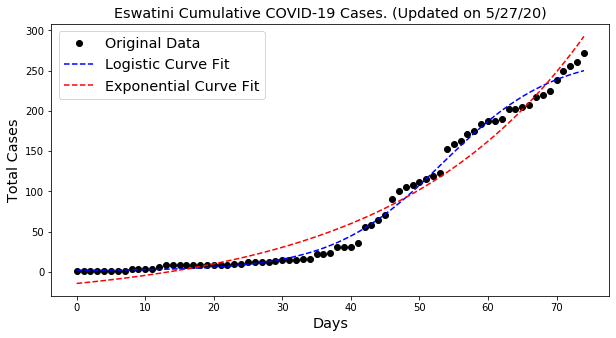



Liberia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 266.0
	Confirmed cases on 5/20/20 	 238.0
	Ratio: 1.12
	Weekly increase: 11.8 %
	Daily increase: 1.6 % per day
	Doubling Time (represents recent growth): 43.6 days

** Based on Logistic Fit**

	R^2: 0.9952017441799629
	Doubling Time (during middle of growth):  16.93 (± 1.6 ) days

** Based on Exponential Fit **

	R^2: 0.9731033653490695
	Doubling Time (represents overall growth):  33.35 (± 7.11 ) days


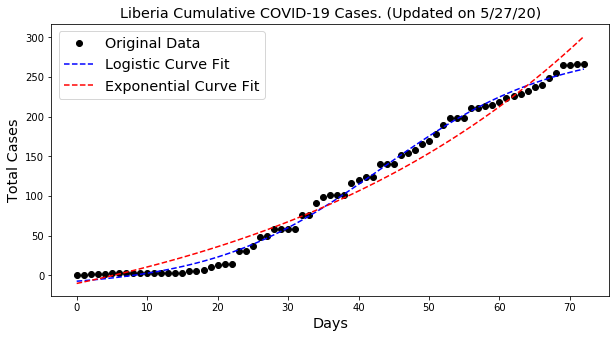



Yemen

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 256.0
	Confirmed cases on 5/20/20 	 184.0
	Ratio: 1.39
	Weekly increase: 39.1 %
	Daily increase: 4.8 % per day
	Doubling Time (represents recent growth): 14.7 days

** Based on Logistic Fit**

	R^2: 0.9977615605677946
	Doubling Time (during middle of growth):  6.54 (± 0.45 ) days

** Based on Exponential Fit **

	R^2: 0.9752061865222696
	Doubling Time (represents overall growth):  8.43 (± 1.04 ) days


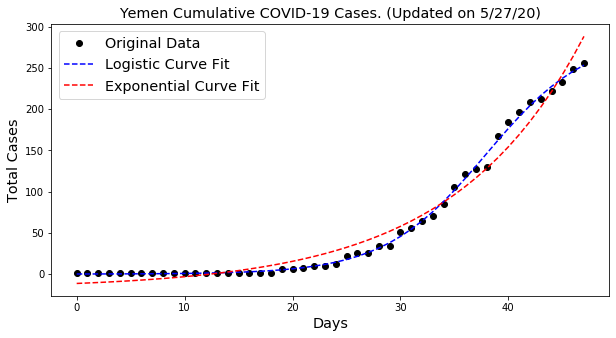



Mozambique

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 227.0
	Confirmed cases on 5/20/20 	 156.0
	Ratio: 1.46
	Weekly increase: 45.5 %
	Daily increase: 5.5 % per day
	Doubling Time (represents recent growth): 12.9 days

** Based on Logistic Fit**

	R^2: 0.9816152781379583
	Doubling Time (during middle of growth):  36.12 (± nan ) days

** Based on Exponential Fit **

	R^2: 0.9816152790873984
	Doubling Time (represents overall growth):  18.06 (± 2.1 ) days


C:\Users\barba\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:44: RuntimeWarning: invalid value encountered in sqrt


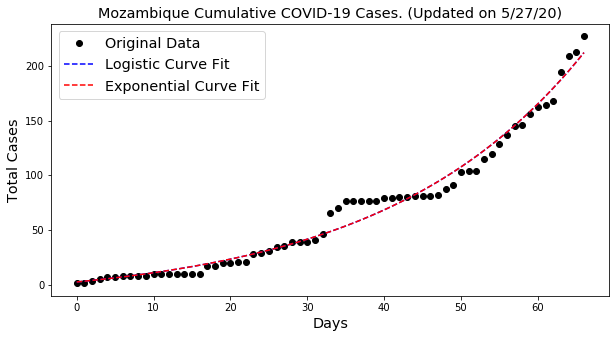



Benin

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 210.0
	Confirmed cases on 5/20/20 	 130.0
	Ratio: 1.62
	Weekly increase: 61.5 %
	Daily increase: 7.1 % per day
	Doubling Time (represents recent growth): 10.1 days


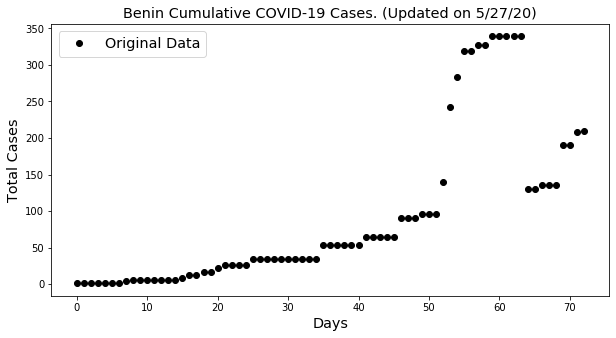



Burma

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 206.0
	Confirmed cases on 5/20/20 	 199.0
	Ratio: 1.04
	Weekly increase: 3.5 %
	Daily increase: 0.5 % per day
	Doubling Time (represents recent growth): 140.3 days

** Based on Logistic Fit**

	R^2: 0.9846398175814897
	Doubling Time (during middle of growth):  10.9 (± 1.72 ) days


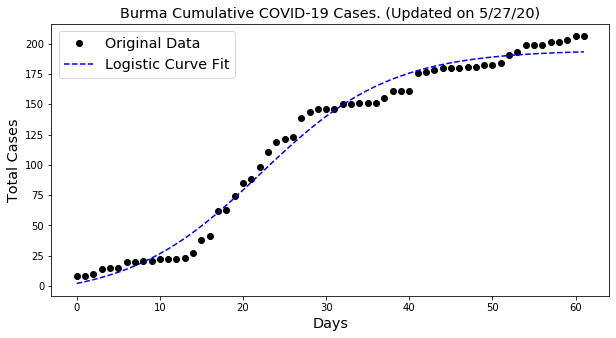



Mongolia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 148.0
	Confirmed cases on 5/20/20 	 140.0
	Ratio: 1.06
	Weekly increase: 5.7 %
	Daily increase: 0.8 % per day
	Doubling Time (represents recent growth): 87.3 days


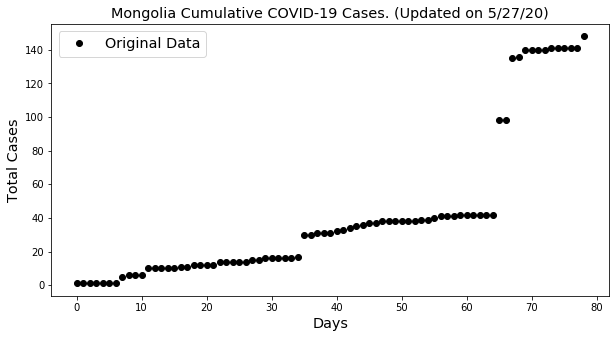



Brunei

** Based on Logistic Fit**

	R^2: 0.9947058757246746
	Doubling Time (during middle of growth):  8.66 (± 0.74 ) days


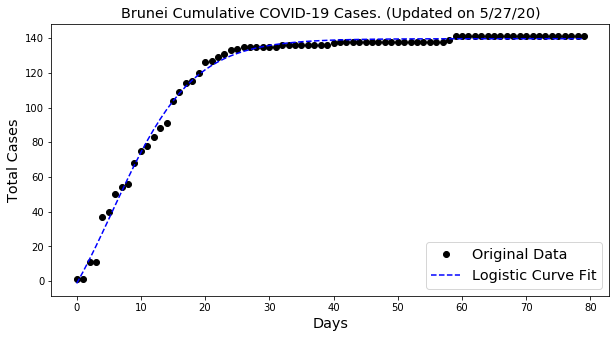



Guyana

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 139.0
	Confirmed cases on 5/20/20 	 125.0
	Ratio: 1.11
	Weekly increase: 11.2 %
	Daily increase: 1.5 % per day
	Doubling Time (represents recent growth): 45.7 days

** Based on Logistic Fit**

	R^2: 0.9882437697665106
	Doubling Time (during middle of growth):  30.05 (± 7.7 ) days

** Based on Exponential Fit **

	R^2: 0.9827219042007131
	Doubling Time (represents overall growth):  56.65 (± 14.46 ) days


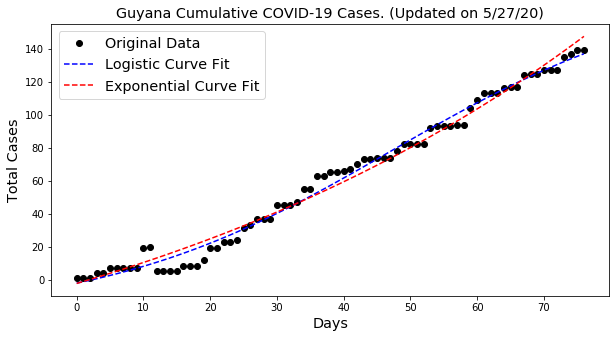



Zimbabwe

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 132.0
	Confirmed cases on 5/20/20 	 48.0
	Ratio: 2.75
	Weekly increase: 175.0 %
	Daily increase: 15.5 % per day
	Doubling Time (represents recent growth): 4.8 days


C:\OSGEO4~1\apps\Python37\lib\site-packages\scipy\optimize\minpack.py:808: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


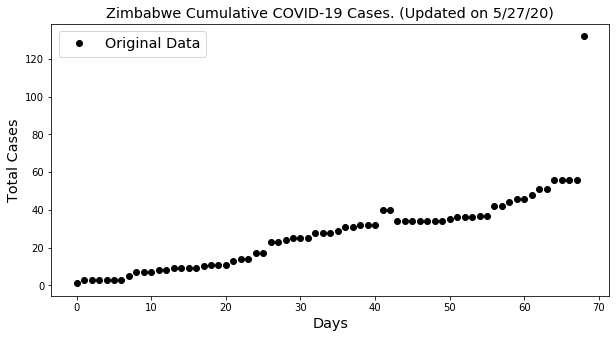



Cambodia

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 124.0
	Confirmed cases on 5/20/20 	 122.0
	Ratio: 1.02
	Weekly increase: 1.6 %
	Daily increase: 0.2 % per day
	Doubling Time (represents recent growth): 298.4 days

** Based on Logistic Fit**

	R^2: 0.9962267935050618
	Doubling Time (during middle of growth):  4.42 (± 0.33 ) days


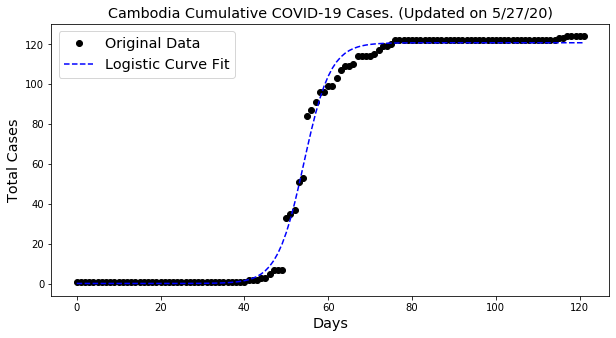



Syria

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 121.0
	Confirmed cases on 5/20/20 	 58.0
	Ratio: 2.09
	Weekly increase: 108.6 %
	Daily increase: 11.1 % per day
	Doubling Time (represents recent growth): 6.6 days


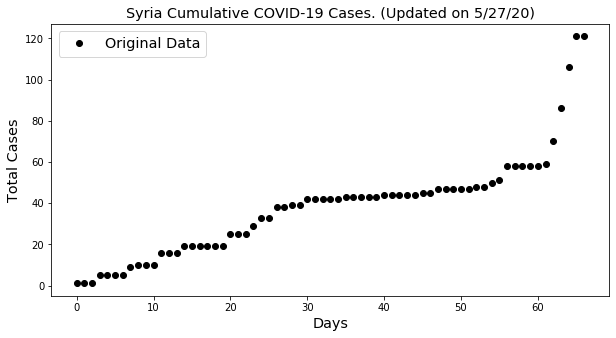



Trinidad and Tobago

** Based on Logistic Fit**

	R^2: 0.9880477588157521
	Doubling Time (during middle of growth):  8.08 (± 1.04 ) days


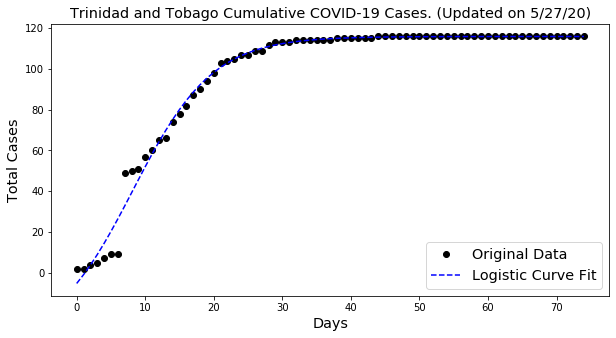



Malawi

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 101.0
	Confirmed cases on 5/20/20 	 71.0
	Ratio: 1.42
	Weekly increase: 42.3 %
	Daily increase: 5.2 % per day
	Doubling Time (represents recent growth): 13.8 days

** Based on Logistic Fit**

	R^2: 0.9829515647736904
	Doubling Time (during middle of growth):  54.31 (± 17.01 ) days

** Based on Exponential Fit **

	R^2: 0.9829515652381247
	Doubling Time (represents overall growth):  27.15 (± 5.47 ) days


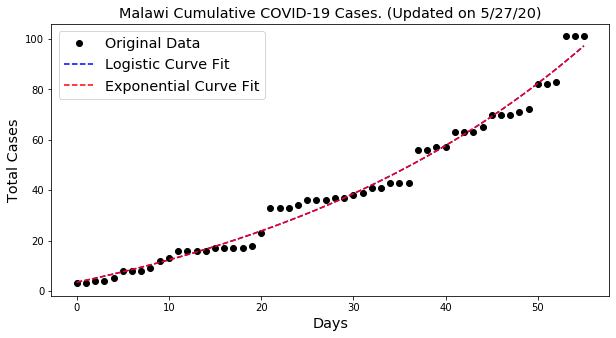



Bahamas

** Based on Most Recent Week of Data **

	Confirmed cases on 5/27/20 	 100.0
	Confirmed cases on 5/20/20 	 97.0
	Ratio: 1.03
	Weekly increase: 3.1 %
	Daily increase: 0.4 % per day
	Doubling Time (represents recent growth): 159.3 days

** Based on Logistic Fit**

	R^2: 0.9961294689099085
	Doubling Time (during middle of growth):  15.93 (± 1.29 ) days


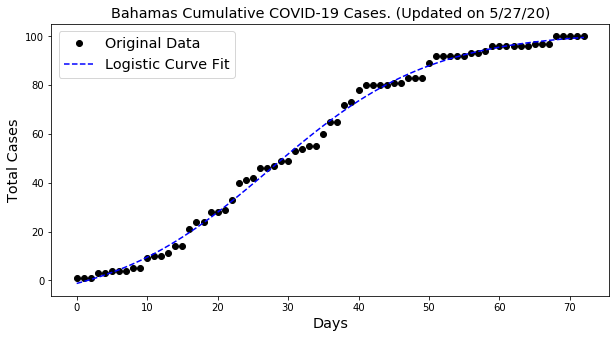

In [10]:
topcountries = cases.index
inferreddoublingtime = []
recentdoublingtime = []
errors = []
countries = []
print('\n')

for c in topcountries:
    print(c)
    a = plotCases(dataCOV, 'Country/Region', c)
    if a:
        countries.append(c)
        inferreddoublingtime.append(a[0])
        errors.append(a[1])
        recentdoublingtime.append(a[2])
    print('\n')

## Different analysis

In [11]:
last_time = dict(file.getheaders())["Date"]
print("Last time modified: " + last_time)

Last time modified: Thu, 28 May 2020 22:08:07 GMT


In [12]:
dict(file.getheaders())

{'Connection': 'close',
 'Content-Length': '118807',
 'Cache-Control': 'max-age=300',
 'Content-Security-Policy': "default-src 'none'; style-src 'unsafe-inline'; sandbox",
 'Content-Type': 'text/plain; charset=utf-8',
 'ETag': 'W/"8b5af0ce38ec2f9ad17244805c404073be086940f5e1c323b15adac40eaab107"',
 'Strict-Transport-Security': 'max-age=31536000',
 'X-Content-Type-Options': 'nosniff',
 'X-Frame-Options': 'deny',
 'X-XSS-Protection': '1; mode=block',
 'Via': '1.1 varnish',
 'X-GitHub-Request-Id': '80DA:77BE:E1314:113510:5ED033CB',
 'Accept-Ranges': 'bytes',
 'Date': 'Thu, 28 May 2020 22:08:07 GMT',
 'X-Served-By': 'cache-mad22040-MAD',
 'X-Cache': 'HIT, HIT',
 'X-Cache-Hits': '4, 1',
 'X-Timer': 'S1590703687.358650,VS0,VE120',
 'Vary': 'Authorization,Accept-Encoding',
 'Access-Control-Allow-Origin': '*',
 'X-Fastly-Request-ID': '0d579cc5edc510afdc8d0bc8da95b5abacfbe7df',
 'Expires': 'Thu, 28 May 2020 22:13:07 GMT',
 'Source-Age': '64'}

In [13]:
grouped_data = dataCOV.groupby(["Country/Region"])

In [14]:
country_data = grouped_data.sum()

In [15]:
country_sum_data = country_data.drop(["Lat","Long"],axis =1).T
country_df = country_sum_data

In [16]:
fig = go.Figure()
for col in country_df.columns:
    fig.add_trace(go.Scatter(
        x = country_df.index,
        y = country_df[col],
        name = col,
        opacity=0.8)) 
fig.update_layout(title = "Wordwilde Cases",yaxis_type="log")

fig.show() 

In [17]:
large_country = country_df.T.loc[country_df.T["5/27/20"]>100000].T
large_country
large_country_diff = large_country.iloc[:,:].diff()
fig = go.Figure()
for col in large_country.columns:
    fig.add_trace(go.Scatter(
        x = large_country.index,
        y = large_country[col],
        name = col,
        opacity=0.8)) 
fig.update_layout(title = "Worldwide Cases with more than 100000 cases",yaxis_type="log")
fig.show()

In [18]:
country_df_diff = country_df.iloc[:,:].diff()

fig = go.Figure()
for col in country_df_diff.columns:
    fig.add_trace(go.Scatter(
        x = country_df_diff.index,
        y = country_df_diff[col],
        name = col,
        opacity=0.8)) 
fig.update_layout(title = "Worldwide Cases (Daily New Cases)", yaxis_type="log")
fig.show() 

In [19]:
df_no_china = country_df.drop("China",axis =1)
fig = go.Figure()
for col in df_no_china.columns:
    fig.add_trace(go.Scatter(
        x = df_no_china.index,
        y = df_no_china[col],
        name = col,
        opacity=0.8)) 
fig.update_layout(title = "Worldwide Cases Without China", yaxis_type="log")
fig.show() 

In [20]:
fig = go.Figure()

fig.add_trace(go.Scatter(
    x = country_df.index,
    y = country_df["China"].values/1368,
    name = "China",
    opacity=0.8)) 

fig.add_trace(go.Scatter(
    x = country_df.index,
    y = country_df["US"].values/327,
    name = "United States",
    opacity=0.8)) 

fig.add_trace(go.Scatter(
    x = country_df.index,
    y = country_df["Italy"].values/60,
    name = "Italy",
    opacity=0.8)) 

fig.add_trace(go.Scatter(
    x = country_df.index,
    y = country_df["United Kingdom"].values/83,
    name = "United Kingdom",
    opacity=0.8)) 

fig.add_trace(go.Scatter(
    x = country_df.index,
    y = country_df["Portugal"].values/67,
    name = "Portugal",
    opacity=0.8)) 

fig.update_layout(title = "Selected Countries",yaxis_type="log")
fig.show() 

In [21]:
fig = go.Figure()

fig.add_trace(go.Scatter(
    x = country_df.index,
    y = country_df_diff["China"]/country_df["China"].values,
    name = "China",
    opacity=0.8)) 

fig.add_trace(go.Scatter(
    x = country_df.index,
    y = country_df_diff["US"]/country_df["US"].values,
    name = "United States",
    opacity=0.8)) 

fig.add_trace(go.Scatter(
    x = country_df.index,
    y = country_df_diff["Italy"]/country_df["Italy"].values,
    name = "Italy",
    opacity=0.8))  

fig.add_trace(go.Scatter(
    x = country_df.index,
    y = country_df_diff["United Kingdom"]/country_df["United Kingdom"].values,
    name = "United Kingdom",
    opacity=0.8)) 

fig.add_trace(go.Scatter(
    x = country_df.index,
    y = country_df_diff["Portugal"]/country_df["Portugal"].values,
    name = "Portugal",
    opacity=0.8)) 

fig.update_layout(title = "Selected Countries",yaxis_type="log")
fig.show()

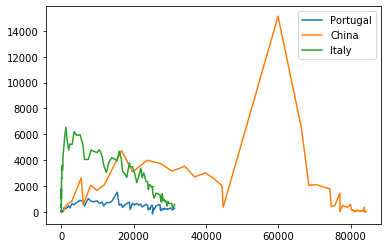

In [23]:
plt.plot(country_df["Portugal"],country_df_diff["Portugal"])
plt.plot(country_df["China"],country_df_diff["China"])
plt.plot(country_df["Portugal"],country_df_diff["Italy"])
plt.legend(['Portugal','China','Italy'])

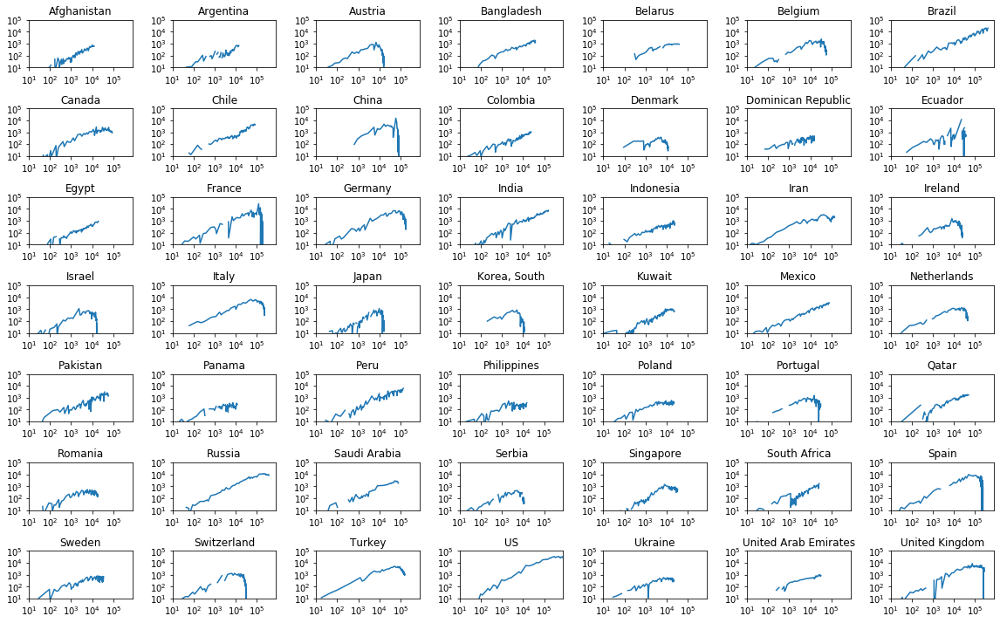

In [24]:
large_country = country_df.T.loc[country_df.T["5/27/20"]>10000].T
large_country[large_country.diff()== 0] = np.NaN
figure, ax = plt.subplots(nrows=7,ncols=7,figsize=(16,10))
m, n = 0,0
for col in large_country.columns:
    ax[m,n].plot(large_country[col],large_country.diff()[col])
    ax[m,n].set_title(col)
    ax[m,n].set_xlim(10,800000)
    ax[m,n].set_ylim(10,100000)
    ax[m,n].set_xscale("symlog")
    ax[m,n].set_yscale("symlog")
    n=n+1
    if n > 6:
        n = 0
        m=m+1

plt.tight_layout(True)